In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, TwoSlopeNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d, interp1d
from os import path
import colorcet as cc   # install quickly with "conda install colorcet"
from scipy.interpolate import RectBivariateSpline
from matplotlib import ticker
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
from lmfit import Model

In [2]:
from mpl_toolkits import mplot3d

In [3]:
from numpy.linalg import inv

In [4]:
import scipy.io

In [5]:
from matplotlib import cm

In [6]:
from scipy.signal import find_peaks

In [7]:
import glob

In [8]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'

In [9]:
%matplotlib widget

In [10]:
font = {
                'family': 'Arial',
                'size': 12,
                'serif': 'Times',
                'sans-serif': 'Arial'
            }

plt.rc('font', **font)

In [11]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [12]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/TBGWSe2_SecondPaper/'

set the full filling and angles of the S13:
-S13 1.09 degrees: slope (B/V) 11.55, capacitance (4.477e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 10, V0 somewhere around 0.5, Rxx mainly 02-25, Rxy 25-28



# device S13, 1.09$^\circ$ fan diagram

## Rxx Fan 02-25

In [12]:
d_S13_Fan_1 = qc.load_data('data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27')
d_S13_Fan_2 = qc.load_data('data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35')
d_S13_Fan_3 = qc.load_data('data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23')

In [13]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0225 = abs(np.vstack((d_S13_Fan_1.lockin830_X[:45,:]/1e-9, d_S13_Fan_2.lockin830_X[1:59,:]/1e-9, d_S13_Fan_3.lockin830_X[1:,:]/1e-9)))

In [14]:
Vgatefull0225 = 10
V00225 = 0.5

In [16]:
nugate0225 = np.interp(gate, [V00225 - Vgatefull0225*5/4, V00225 + Vgatefull0225*5/4], [-5, 5])

In [18]:
Rxx0225Bfunc = RectBivariateSpline(nugate0225, Bfield, Rxx0225.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


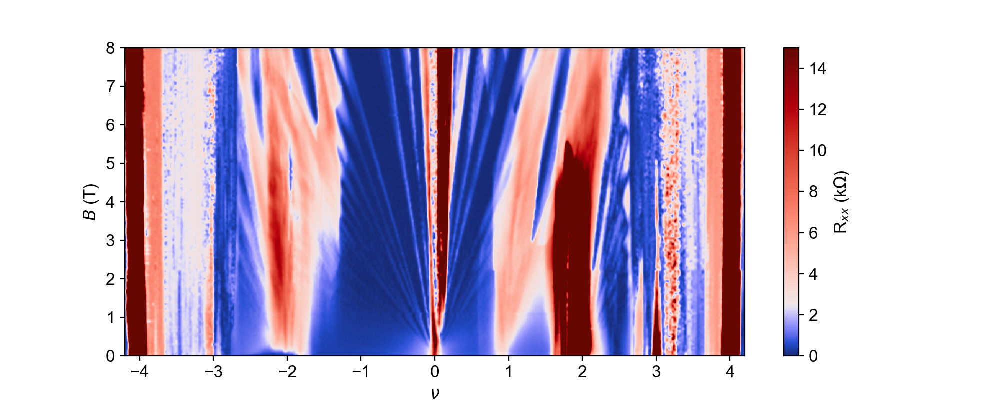

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fa80a0eff60>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [94]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx0225Bint = Rxx0225Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(2.5, vmin=0, vmax=15), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## Rxy Fan 25-28

In [850]:
d_S13_Fan_1 = qc.load_data('data/2020-12-11/#014_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_22-29-22')
d_S13_Fan_2 = qc.load_data('data/2020-12-12/#001_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_base_1nA_Landaufan_18-16-00')

In [851]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set, d_S13_Fan_2.triton_field_set_stable_set))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxy2528 = np.vstack((npd.Rxxfromdata(d_S13_Fan_1, 1e-9, 'lockin830'), npd.Rxxfromdata(d_S13_Fan_2, 1e-9, 'lockin830')))

In [852]:
Vgatefull2528 = 10
V02528 = 0.5

In [853]:
nugate2528 = np.interp(gate, [V02528 - Vgatefull2528*5/4, V02528 + Vgatefull2528*5/4], [-5, 5])

In [854]:
Rxy2528Bfunc = RectBivariateSpline(nugate2528, Bfield, Rxy2528.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


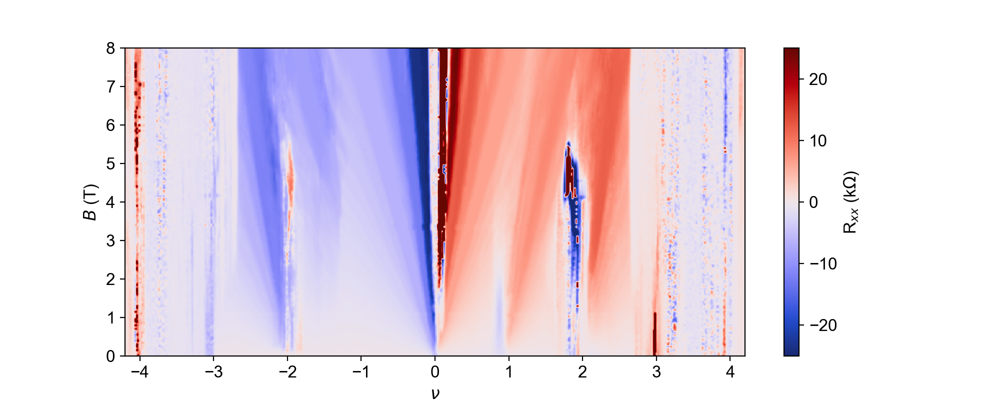

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fa6f8b747f0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [855]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxy2528Bint = Rxy2528Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxy2528Bint, (1, 1))/1000, norm=colors.TwoSlopeNorm(0,  vmin=-25, vmax=25), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


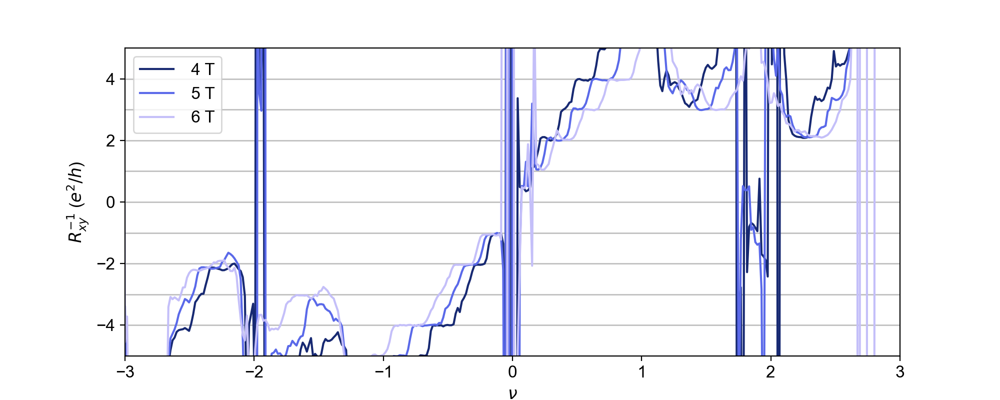

In [446]:
esqh = 1.602e-19**2/6.626e-34
plt.figure(figsize=(10, 4))

N = 6
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(3):
    indx =  80+ i*20
    plt.plot((gate-V02528)/Vgatefull2528*4, 1/gaussian_filter(Rxy2528[indx,:],0.5)/(esqh*1.02),  color = cs[i], label=' {:.0f} T'.format(Bfield[indx]))

plt.hlines(-4, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-3, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-2, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(-1, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(0, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(4, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(3, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(2, -16,16, color='gray', lw=1, alpha=0.5)
plt.hlines(1, -16,16, color='gray', lw=1, alpha=0.5)

plt.xlim(-4,4)
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylim(-5,5)
plt.xlim(-3,3)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xy}^{-1}$ ($e^2/h$)')
plt.legend()

# device S13, 1.09$^\circ$ fan diagram around one quarter

## base

In [52]:
d_S13_quarter_fan_base = qc.load_data('data/2021-01-12/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_base_B-n_1quarter_02-41-38')

In [53]:
Bfield = d_S13_quarter_fan_base.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_base.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_base, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_base, 2e-9, 'lockin830')

In [54]:
Vgatefull0225 = 10
V00225 = 0.5
Vgatefull2528 = 10
V02528 = 0.5

In [55]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=TwoSlopeNorm(4, vmin=0, vmax=7.5), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2, 5)

In [56]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.TwoSlopeNorm(0,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2, 5)

In [58]:
Rxy_sym = (Rxy2528[:,:] - Rxy2528[::-1,:])/2
Rxx_sym = (Rxx0225[:,:] + Rxx0225[::-1,:])/2

sigma_xy = Rxy_sym/((Rxx_sym)**2+Rxy_sym**2)

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, sigma_xy/(3.874e-5), cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-5, vmax=5))


plt.xlabel(r'$\nu$')
#plt.xticks([0, 1, 2])
plt.ylabel('B (T)')

plt.colorbar(label='$\sigma_{xy}$ ($e^2/h$)')
plt.axis()
plt.ylim(-2,5)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2, 5)

In [59]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(1,9):
    indx =  i*3+124
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i-1], label='B {:.2f} T'.format(Bfield[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-3,4)
plt.xlim(0.6,1.1)
plt.yticks([-2,0,1,2,3])
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

<IPython.core.display.Javascript object>


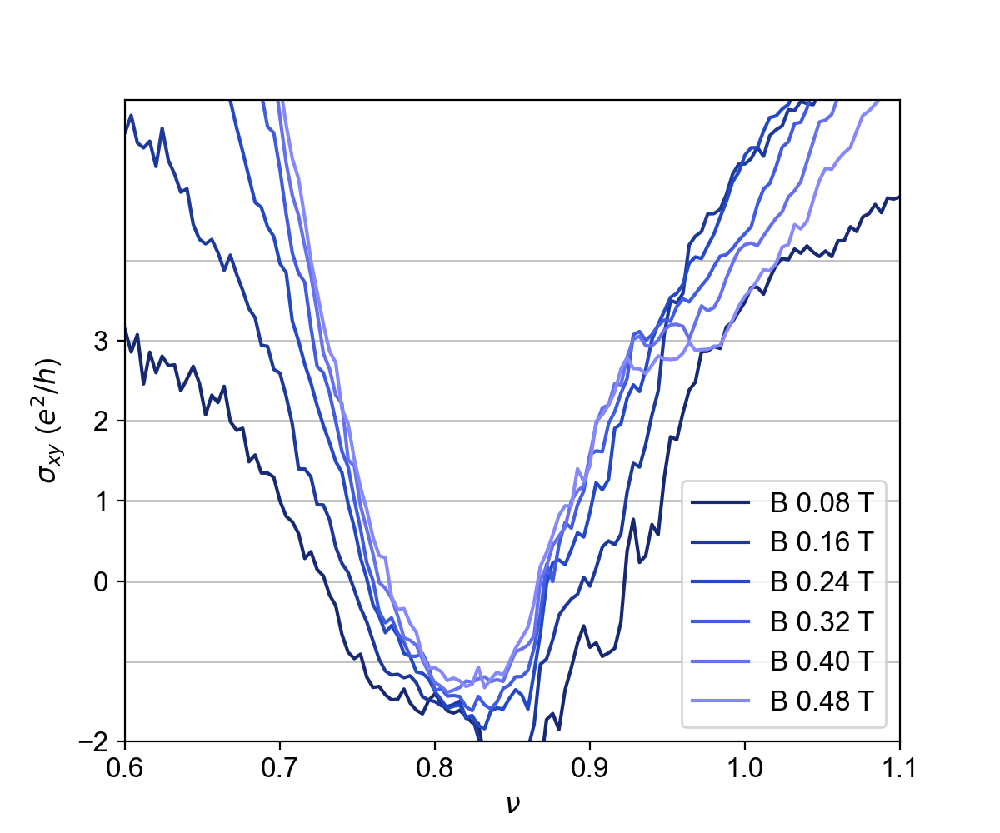

In [893]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(1,7):
    indx =  i*2+125
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i-1], label='B {:.2f} T'.format(Bfield[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(4,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-1.5,6)
plt.xlim(0.6,1.1)
plt.yticks([-2,0,1,2,3])
plt.legend()

In [71]:
N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, ax1 = plt.subplots(figsize=(4, 6))
ax2 = ax1.twinx()

for i in range(48,51):
    indx =  i*5
    ax1.plot((gate[:]-V02528)/Vgatefull2528*4, (gaussian_filter((Rxy2528[indx,:]),2))/(1/3.87404e-5),  color = cs[i-48], label='B {:.2f} T'.format(Bfield[indx]))

ax1.hlines(1/3,  0,2, color='blue',linestyles='dashed',lw=1, alpha=0.5)

for i in range(48,51):
    indx =  i*5
    ax2.plot((gate[:]-V02528)/Vgatefull2528*4, gaussian_filter((Rxx0225[indx,:]),2)/1000,  color = cs[i-48+15], label='B {:.2f} T'.format(Bfield[indx]))
    
ax1.set_xlabel(r'$\nu$')
ax1.set_ylabel('$R_{xy}$ ($e^2/h$)')
ax1.set_ylim(0,0.5)
ax1.set_xlim(1.25,1.6)

ax2.set_ylim(0,5)
ax2.set_ylabel('$R_{xx}$ (k$\Omega$)')

ax1.legend()
ax2.legend()

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## 3K

In [13]:
d_S13_quarter_fan_3K = qc.load_data('data/2021-01-06/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_3K_B-n_1quarter_14-19-45')

In [14]:
Bfield = d_S13_quarter_fan_3K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_3K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_3K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_3K, 2e-9, 'lockin830')

In [15]:
Vgatefull0225 = 10
V00225 = 0.5
Vgatefull2528 = 10
V02528 = 0.5

In [16]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=TwoSlopeNorm(4, vmin=1, vmax=6.6), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2.0, 5.0)

In [17]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.TwoSlopeNorm(0,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2.0, 5.0)

In [18]:
Rxy_sym = (Rxy2528[:,:] - Rxy2528[::-1,:])/2
Rxx_sym = (Rxx0225[:,:] + Rxx0225[::-1,:])/2

sigma_xy = Rxy_sym/((Rxx_sym*1.1)**2+Rxy_sym**2)

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, sigma_xy/(3.874e-5), cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-5, vmax=5))


plt.xlabel(r'$\nu$')
#plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$\sigma_{xy}$ ($e^2/h$)')
plt.axis()
plt.ylim(-2,5)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2.0, 5.0)

In [19]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(1,7):
    indx =  i*2+112
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i-1], label='B {:.2f} T'.format(Bfield[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(4,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-1.5,6)
plt.xlim(0.6,1.1)
plt.yticks([-2,0,1,2,3])
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## 5K

In [20]:
d_S13_quarter_fan_5K = qc.load_data('data/2021-01-07/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_5K_B-n_1quarter_19-06-57')
Bfield = d_S13_quarter_fan_5K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_5K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_5K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_5K, 2e-9, 'lockin830')

In [21]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=TwoSlopeNorm(4, vmin=1, vmax=6.8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(-2.0, 5.0)

<IPython.core.display.Javascript object>


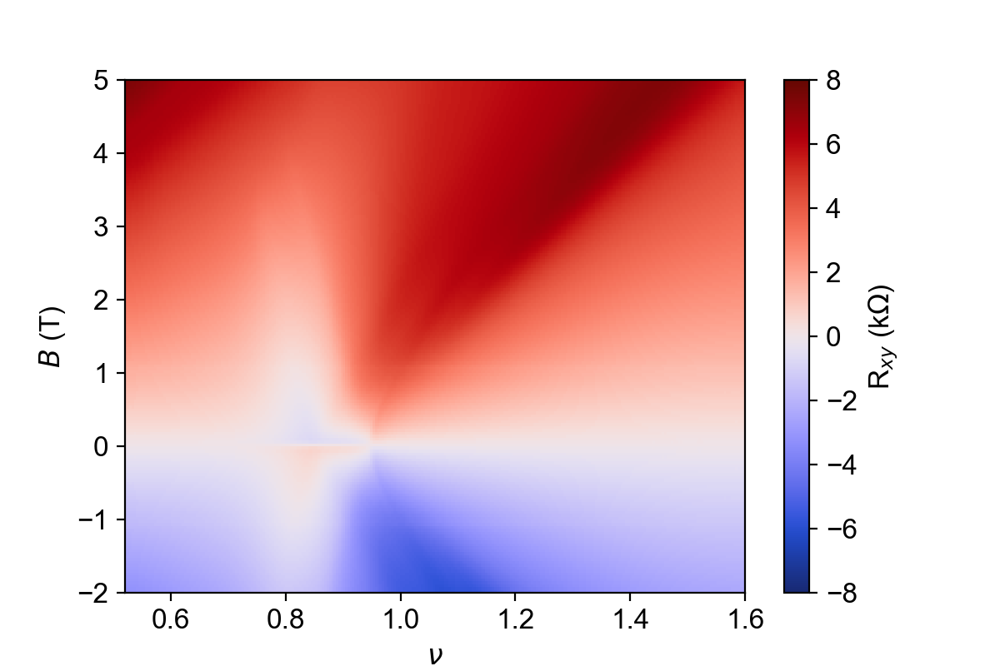

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(-2.0, 5.0)

In [571]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.TwoSlopeNorm(0,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

## 7.5K

In [572]:
d_S13_quarter_fan_7p5K = qc.load_data('data/2021-01-08/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_2nA_7p5K_B-n_1quarter_23-45-16')
Bfield = d_S13_quarter_fan_7p5K.triton_field_set_stable_set[:]
gate = d_S13_quarter_fan_7p5K.srframe_volt_p1_set[0, :]
Rxx0225 = npd.Rxxfromdata(d_S13_quarter_fan_7p5K, 2e-9, 'lockin865')
Rxy2528 = npd.Rxxfromdata(d_S13_quarter_fan_7p5K, 2e-9, 'lockin830')

<IPython.core.display.Javascript object>


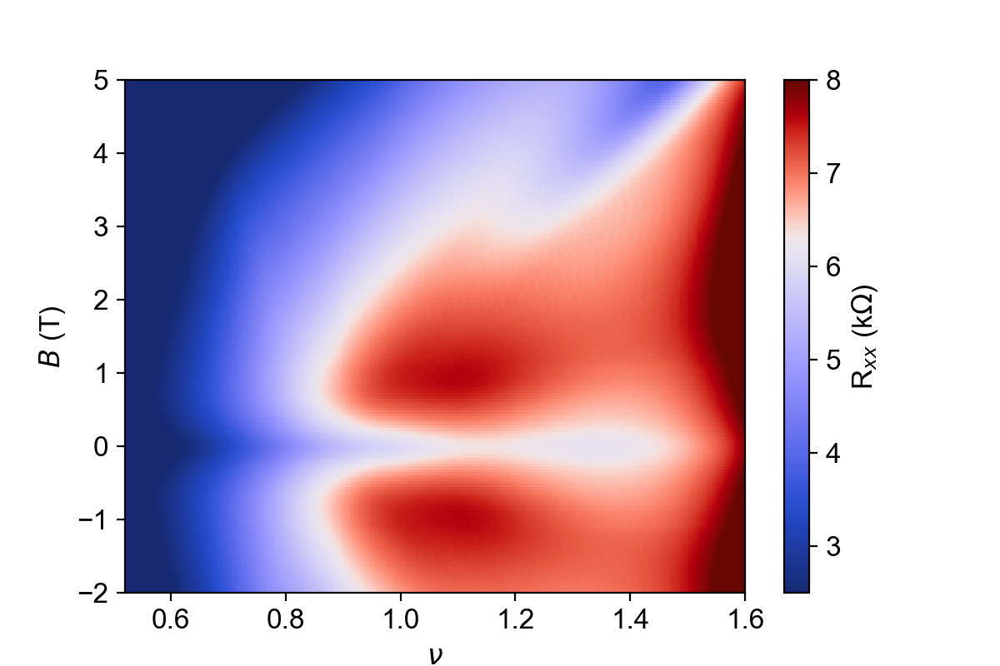

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(-2.0, 5.0)

In [234]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, Bfield, gaussian_filter((Rxx0225[:,:] + Rxx0225[::-1,:])/2, (0.7, 0.7))/1000, norm=TwoSlopeNorm(6.3, vmin=2.5, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

<IPython.core.display.Javascript object>


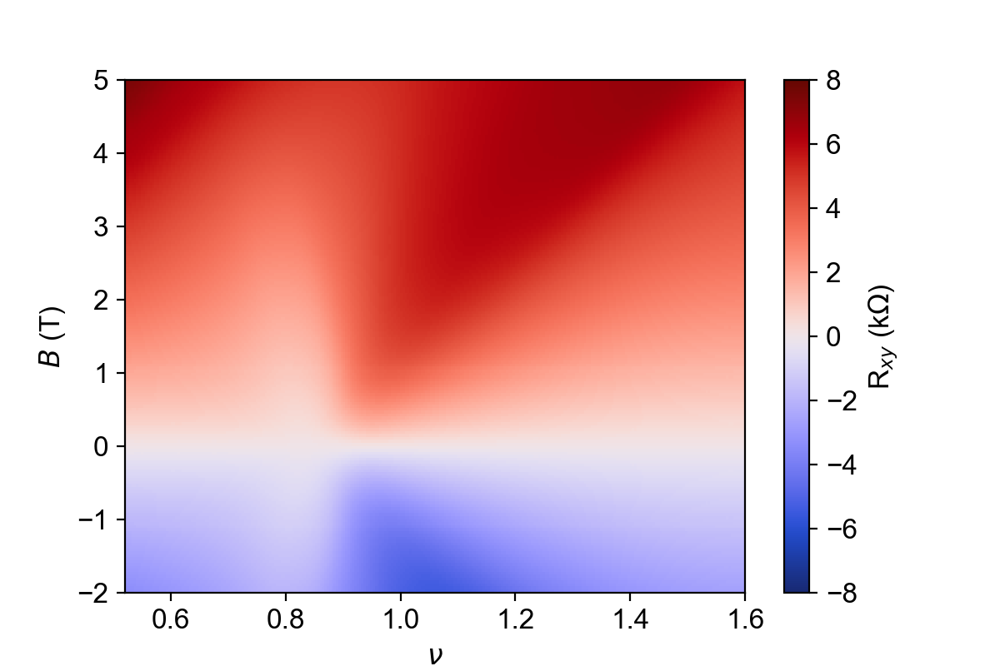

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(-2.0, 5.0)

In [573]:
plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V02528)/Vgatefull2528*4, Bfield, gaussian_filter((Rxy2528[:,:] - Rxy2528[::-1,:])/2, (0.7, 0.7))/1000, norm=colors.TwoSlopeNorm(0,  vmin=-8, vmax=8), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.ylim (-2,5) 

# ferromagnetism filling dependency at different T (best one 1.5K)

## 1.5K

In [699]:
files2528_1quarter_1p5K_1 = sorted(glob.glob('data/2020-12-23/#*/'))[74:124]
files2528_1quarter_1p5K_2 = sorted(glob.glob('data/2020-12-20/#*/'))[108:]
files2528_1quarter_1p5K_3 = sorted(glob.glob('data/2020-12-21/#*/'))[:69]
files2528_1quarter_1p5K = files2528_1quarter_1p5K_1 + files2528_1quarter_1p5K_2 + files2528_1quarter_1p5K_3

In [700]:
nB = 501
nfiles2528_1quarter_1p5K = len(files2528_1quarter_1p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_1p5K), nB))

for i, f in enumerate(files2528_1quarter_1p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [701]:
nB = 501
nfiles2528_1quarter_1p5K = len(files2528_1quarter_1p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray865 = np.zeros((len(files2528_1quarter_1p5K), nB))

for i, f in enumerate(files2528_1quarter_1p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray865[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray865[i, :] = Vint[::-1]

In [702]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))

In [703]:
totalarray865_up = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))
totalarray865_down = np.zeros((int(len(files2528_1quarter_1p5K)/2), nB))

In [704]:
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [705]:
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray865_up[i,:] = totalarray865[2*i, :] 
for i in range(int(len(files2528_1quarter_1p5K)/2)):
    totalarray865_down[i,:] = totalarray865[2*i+1, :] 

In [706]:
totalarray830_delta = totalarray830_up - totalarray830_down

In [707]:
totalarray865_ave = (totalarray865_up + totalarray865_down)/2

<IPython.core.display.Javascript object>


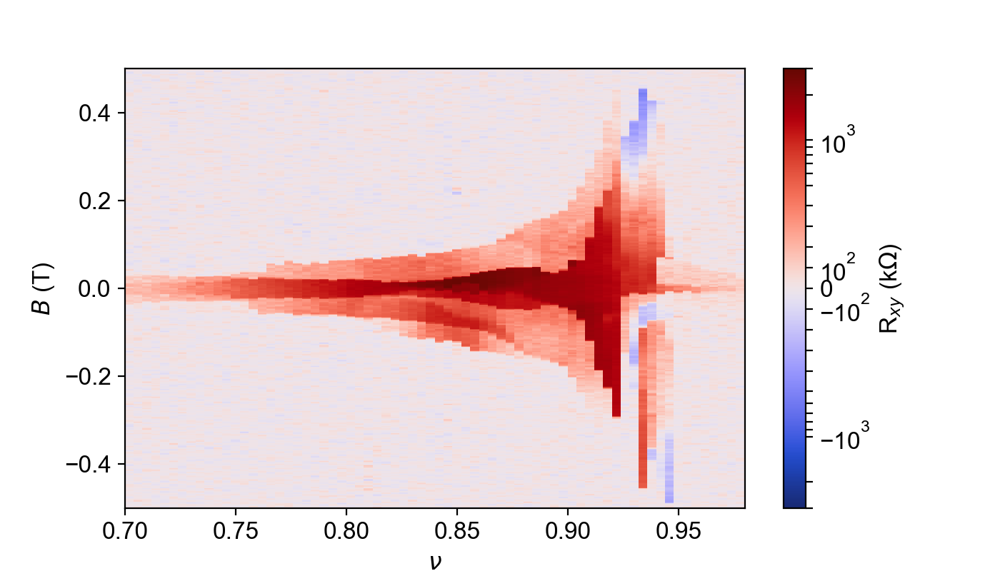

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  """
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  """


In [708]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.25, 2.95, 71)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3))
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='R$_{xy}$ (k$\Omega$)')

### get 0 field $\sigma_{xy}$

<IPython.core.display.Javascript object>


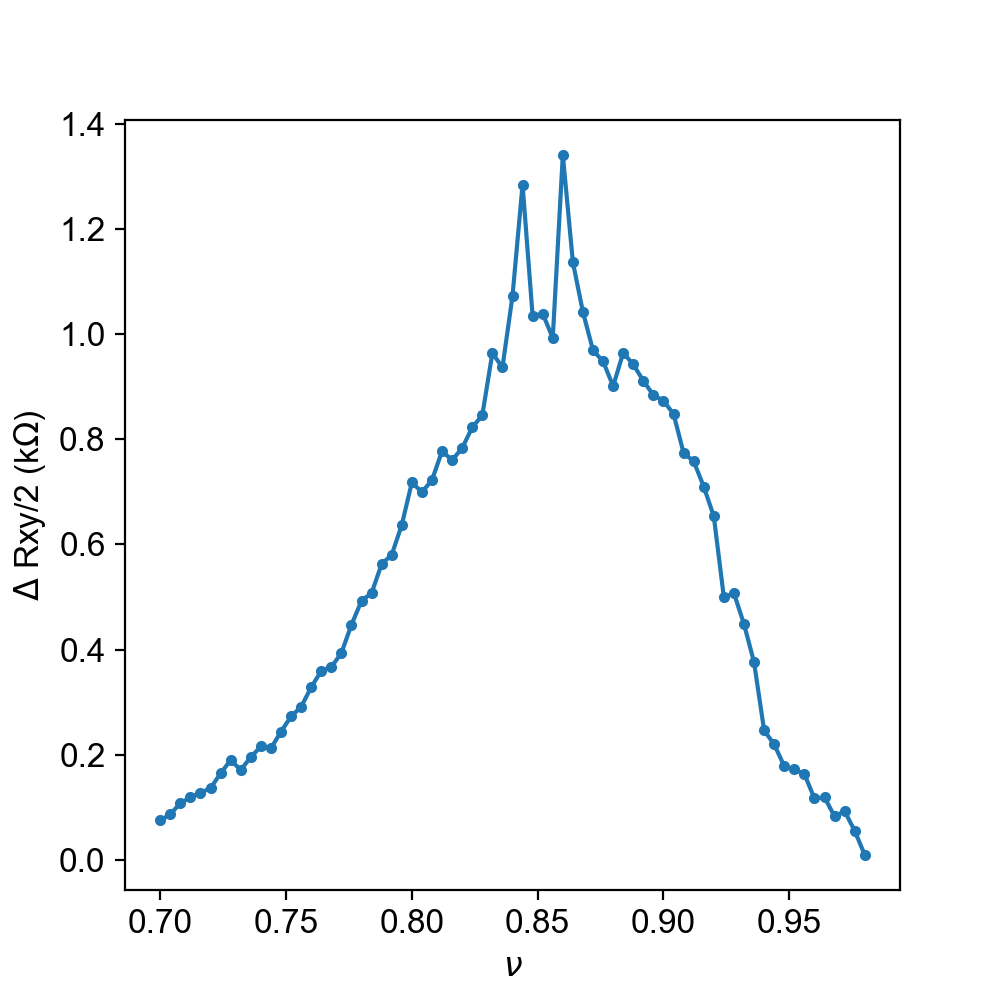

Text(0, 0.5, '$\\Delta$ Rxy/2 (k$\\Omega$)')

In [604]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.25, 2.95, 71)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray830_delta[:,250]/1e-9/2/1000, '.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$\Delta$ Rxy/2 (k$\Omega$)')

<IPython.core.display.Javascript object>


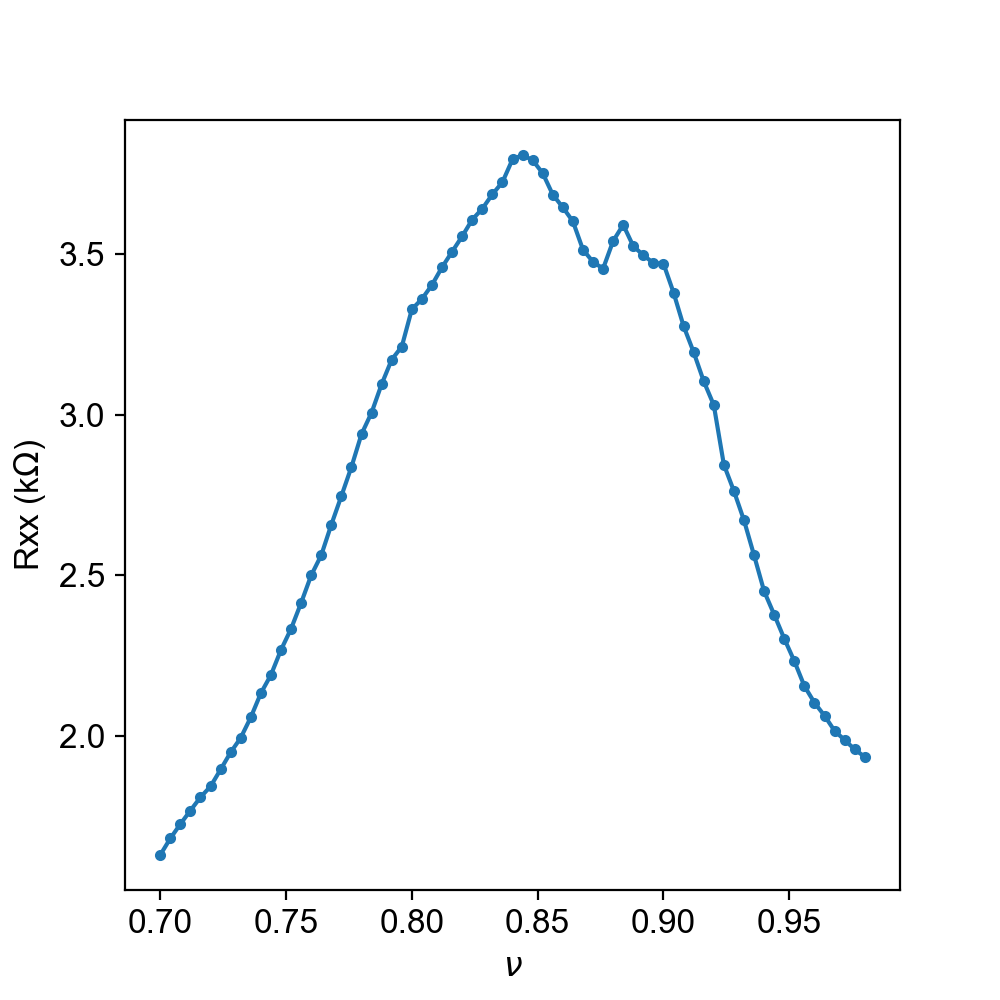

Text(0, 0.5, 'Rxx (k$\\Omega$)')

In [608]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.25, 2.95, 71)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray865_ave[:,250]/1e-9/1000,'.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'Rxx (k$\Omega$)')

<IPython.core.display.Javascript object>


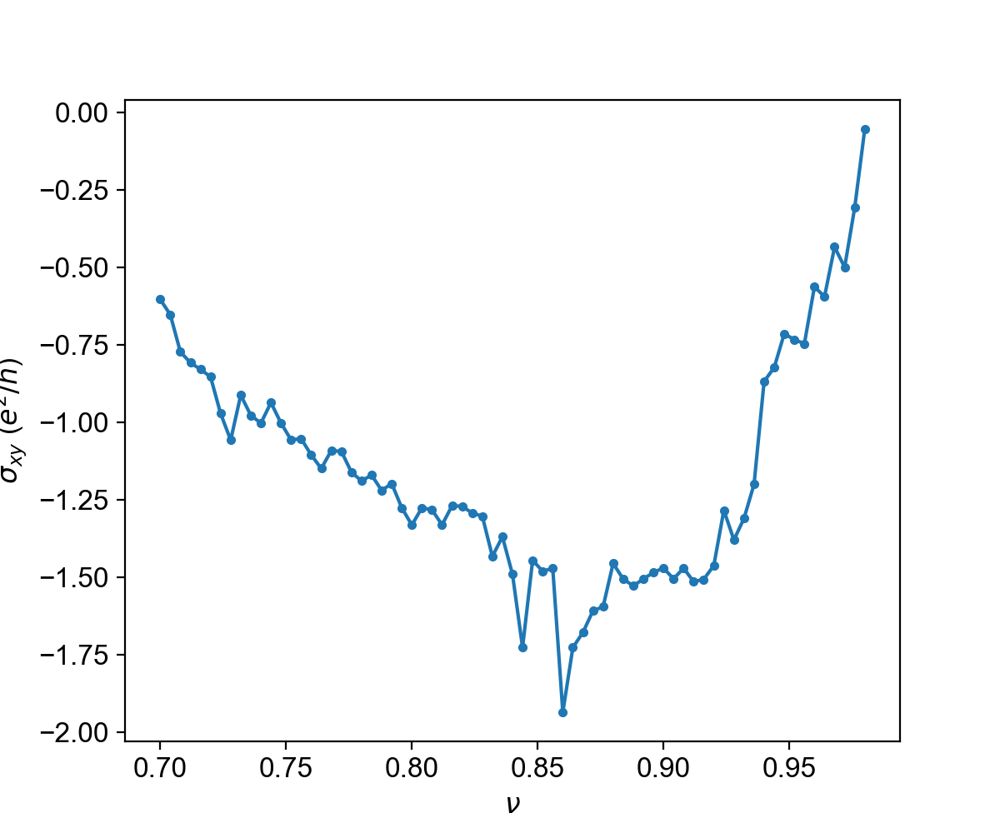

Text(0, 0.5, '$\\sigma_{xy}$ ($e^2/h$)')

In [710]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.25, 2.95, 71)-V0)/Vfull*4
plt.figure(figsize=(6,5))
plt.plot(filling,-(totalarray830_delta[:,250]/1e-9/2)/((totalarray865_ave[:,250]/1e-9*1.1)**2+(totalarray830_delta[:,250]/1e-9/2)**2)/(3.874e-5), '.-')
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')

## 3.5K

In [681]:
files2528_1quarter_3p5K_1 = sorted(glob.glob('data/2020-12-21/#*/'))[222:]
files2528_1quarter_3p5K_2 = sorted(glob.glob('data/2020-12-22/#*/'))[:27]
files2528_1quarter_3p5K_3 = sorted(glob.glob('data/2020-12-18/#*/'))[174:]
files2528_1quarter_3p5K_4 = sorted(glob.glob('data/2020-12-19/#*/'))[:58]
files2528_1quarter_3p5K = files2528_1quarter_3p5K_1 + files2528_1quarter_3p5K_2 + files2528_1quarter_3p5K_3 + files2528_1quarter_3p5K_4

In [682]:
nB = 501
nfiles2528_1quarter_3p5K = len(files2528_1quarter_3p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_3p5K), nB))

for i, f in enumerate(files2528_1quarter_3p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [683]:
nB = 501
nfiles2528_1quarter_3p5K = len(files2528_1quarter_3p5K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray865 = np.zeros((len(files2528_1quarter_3p5K), nB))

for i, f in enumerate(files2528_1quarter_3p5K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray865[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray865[i, :] = Vint[::-1]

In [684]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))

In [685]:
totalarray865_up = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))
totalarray865_down = np.zeros((int(len(files2528_1quarter_3p5K)/2), nB))

In [686]:
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [687]:
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray865_up[i,:] = totalarray865[2*i, :] 
for i in range(int(len(files2528_1quarter_3p5K)/2)):
    totalarray865_down[i,:] = totalarray865[2*i+1, :] 

In [688]:
totalarray830_delta = totalarray830_up - totalarray830_down

In [689]:
totalarray865_ave = (totalarray865_up + totalarray865_down)/2

<IPython.core.display.Javascript object>


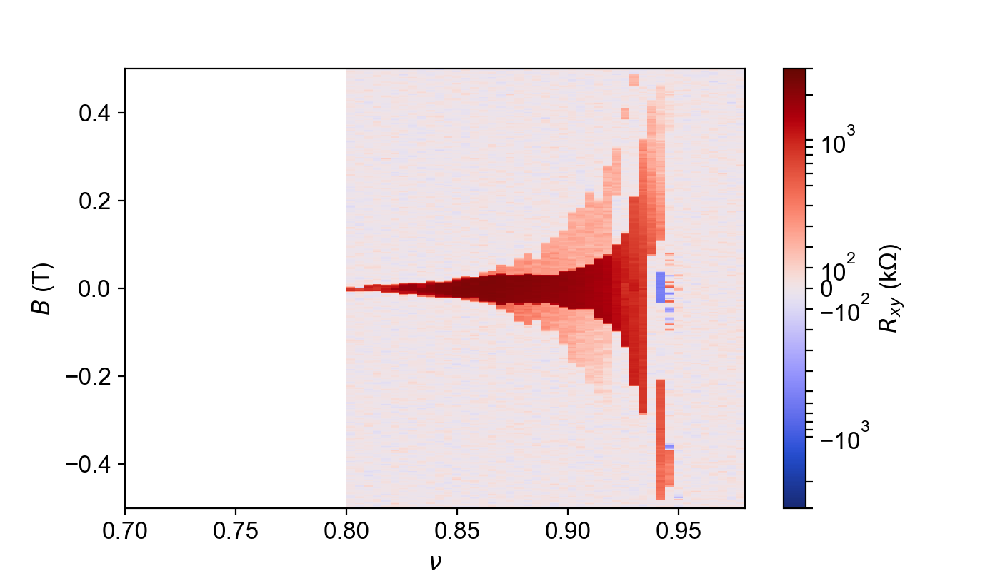

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  """
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  """


(0.7, 0.9800000000000001)

In [692]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.5, 2.95, 46)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3))
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.xlim((2.25-V0)/Vfull*4, (2.95-V0)/Vfull*4)

<IPython.core.display.Javascript object>


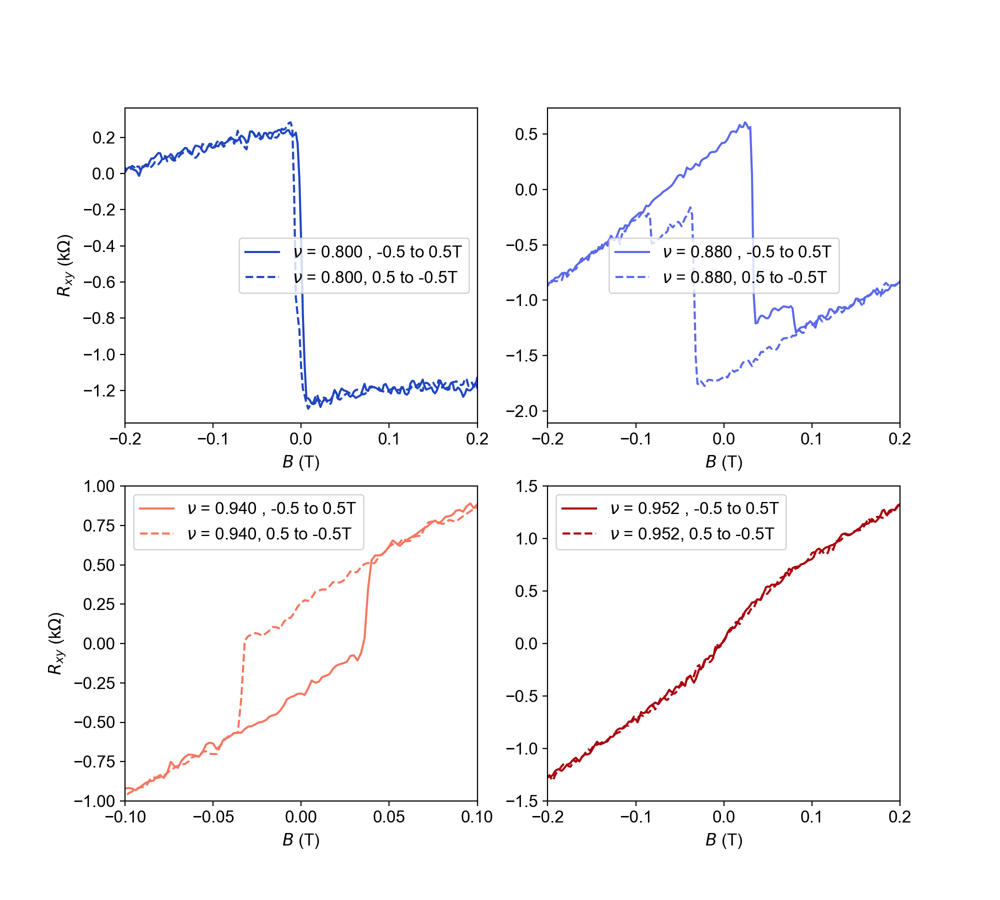

In [844]:
N = 11 # some plots showing sign change
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, axs = plt.subplots(2, 2, figsize=(10, 9))

i=0
axs[0, 0].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[1], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 0].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[1], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 0].set_xlim(-0.2, 0.2)
axs[0, 0].set_xlabel('$B$ (T)')
axs[0, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[0, 0].legend()


i=20
axs[0, 1].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[2], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 1].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[2], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 1].set_xlim(-0.2, 0.2)
axs[0, 1].set_xlabel('$B$ (T)')
axs[0, 1].legend()

i=35
axs[1, 0].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[7], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 0].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[7], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 0].set_xlim(-0.1, 0.1)
axs[1, 0].set_ylim(-1, 1)
axs[1, 0].set_xlabel('$B$ (T)')
axs[1, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[1, 0].legend()

i=38
axs[1, 1].plot(bpts, totalarray830_up[i,:]/1e-9/1000, color = cs[9], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 1].plot(bpts, totalarray830_down[i,:]/1e-9/1000, '--', color = cs[9], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 1].set_xlim(-0.2, 0.2)
axs[1, 1].set_ylim(-1.5, 1.5)
axs[1, 1].set_xlabel('$B$ (T)')
axs[1, 1].legend()

<IPython.core.display.Javascript object>


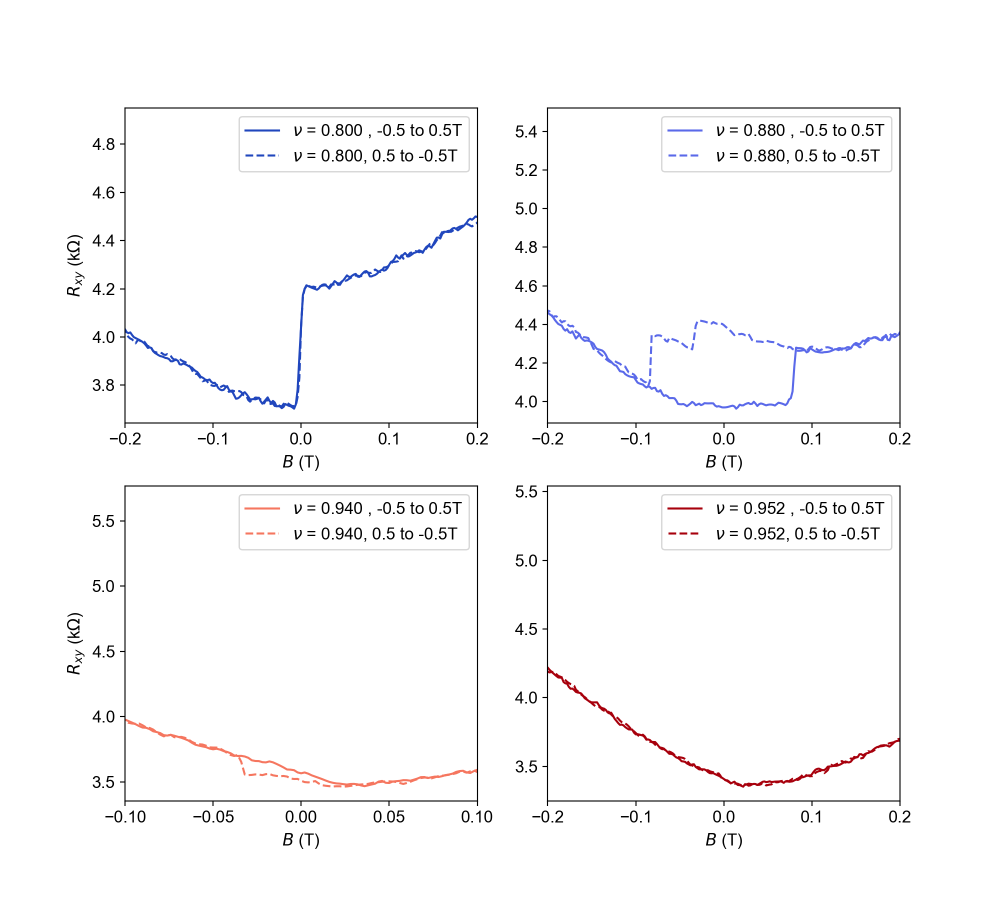

In [845]:
N = 11 # some plots showing sign change
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, axs = plt.subplots(2, 2, figsize=(10, 9))

i=0
axs[0, 0].plot(bpts, totalarray865_up[i,:]/1e-9/1000, color = cs[1], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 0].plot(bpts, totalarray865_down[i,:]/1e-9/1000, '--', color = cs[1], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 0].set_xlim(-0.2, 0.2)
axs[0, 0].set_xlabel('$B$ (T)')
axs[0, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[0, 0].legend()


i=20
axs[0, 1].plot(bpts, totalarray865_up[i,:]/1e-9/1000, color = cs[2], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[0, 1].plot(bpts, totalarray865_down[i,:]/1e-9/1000, '--', color = cs[2], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[0, 1].set_xlim(-0.2, 0.2)
axs[0, 1].set_xlabel('$B$ (T)')
axs[0, 1].legend()

i=35
axs[1, 0].plot(bpts, totalarray865_up[i,:]/1e-9/1000, color = cs[7], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 0].plot(bpts, totalarray865_down[i,:]/1e-9/1000, '--', color = cs[7], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 0].set_xlim(-0.1, 0.1)

axs[1, 0].set_xlabel('$B$ (T)')
axs[1, 0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[1, 0].legend()

i=38
axs[1, 1].plot(bpts, totalarray865_up[i,:]/1e-9/1000, color = cs[9], label=r'$\nu$ = {:.3f} , -0.5 to 0.5T'.format(filling[i]))
axs[1, 1].plot(bpts, totalarray865_down[i,:]/1e-9/1000, '--', color = cs[9], label=r'$\nu$ = {:.3f}, 0.5 to -0.5T'.format(filling[i]))
axs[1, 1].set_xlim(-0.2, 0.2)

axs[1, 1].set_xlabel('$B$ (T)')
axs[1, 1].legend()

### get 0 field $\sigma_{xy}$

<IPython.core.display.Javascript object>


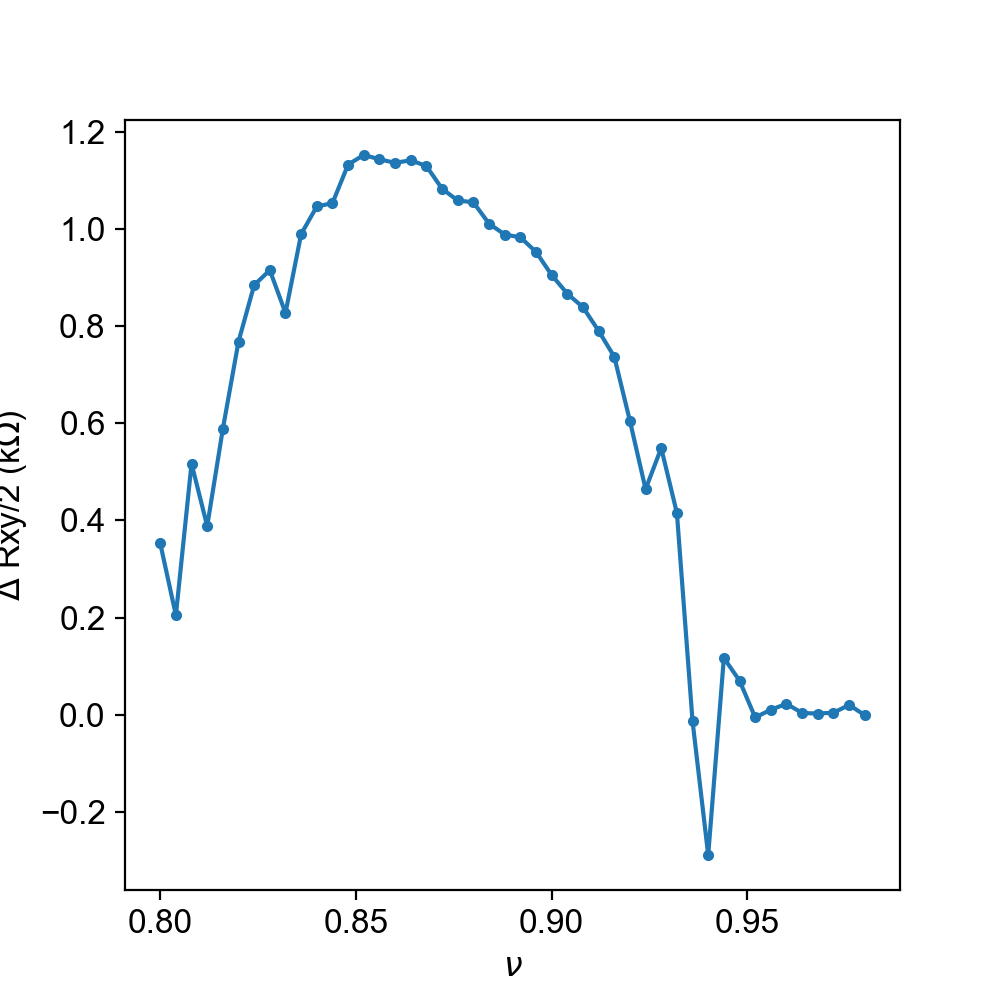

Text(0, 0.5, '$\\Delta$ Rxy/2 (k$\\Omega$)')

In [693]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.5, 2.95, 46)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray830_delta[:,250]/1e-9/2/1000, '.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$\Delta$ Rxy/2 (k$\Omega$)')

<IPython.core.display.Javascript object>


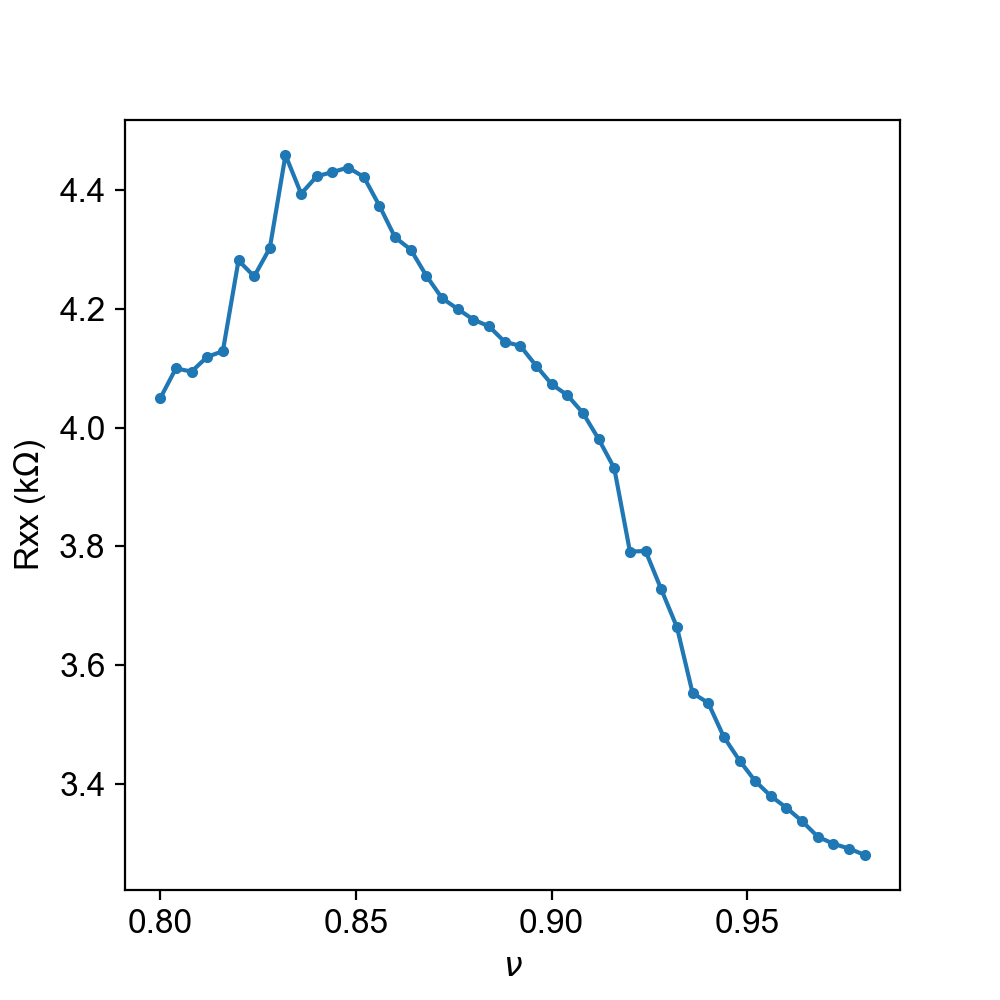

Text(0, 0.5, 'Rxx (k$\\Omega$)')

In [694]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.5, 2.95, 46)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray865_ave[:,250]/1e-9/1000, '.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'Rxx (k$\Omega$)')


<IPython.core.display.Javascript object>


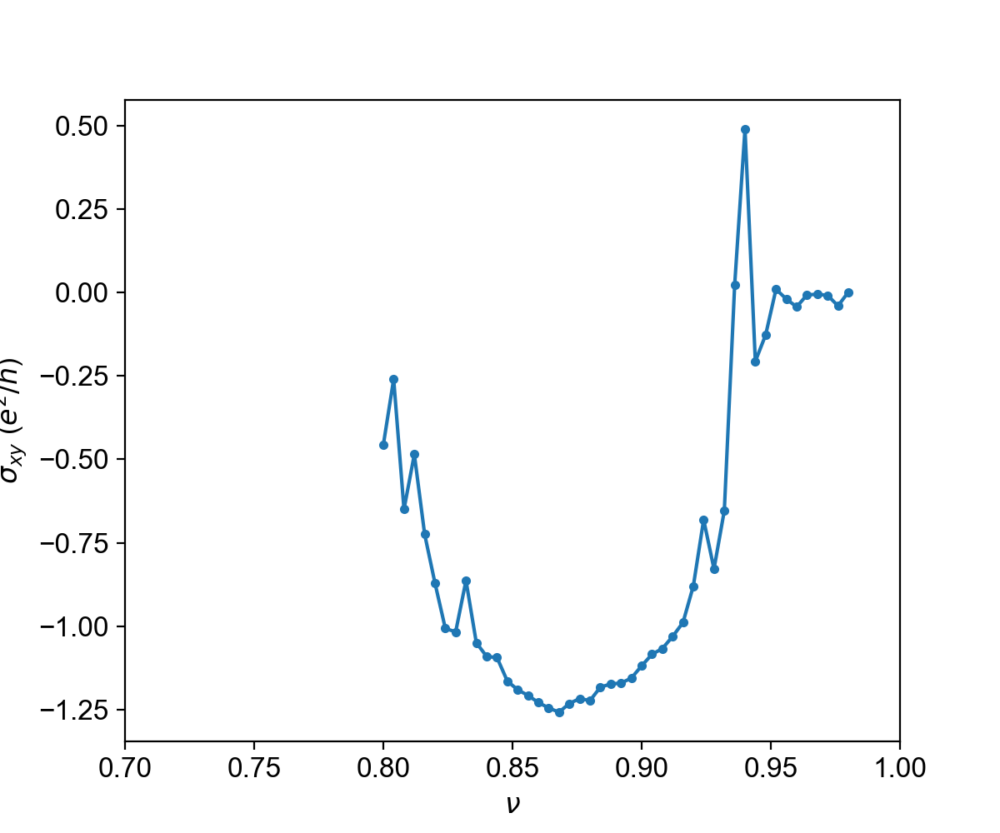

(0.7, 1.0)

In [696]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.5, 2.95, 46)-V0)/Vfull*4
plt.figure(figsize=(6,5))
plt.plot(filling,-(totalarray830_delta[:,250]/1e-9/2)/((totalarray865_ave[:,250]/1e-9*1.1)**2+(totalarray830_delta[:,250]/1e-9/2)**2)/(3.874e-5), '.-')
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.xlim(0.7,1)

## 4K

In [14]:
files2528_1quarter_4K = sorted(glob.glob('data/2020-12-20/#*/'))[:82]

In [15]:
nB = 501
nfiles2528_1quarter_4K = len(files2528_1quarter_4K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files2528_1quarter_4K), nB))

for i, f in enumerate(files2528_1quarter_4K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [16]:
nB = 501
nfiles2528_1quarter_4K = len(files2528_1quarter_4K)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray865 = np.zeros((len(files2528_1quarter_4K), nB))

for i, f in enumerate(files2528_1quarter_4K):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray865[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin865_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray865[i, :] = Vint[::-1]

In [17]:
totalarray830_up = np.zeros((int(len(files2528_1quarter_4K)/2), nB))
totalarray830_down = np.zeros((int(len(files2528_1quarter_4K)/2), nB))

In [18]:
totalarray865_up = np.zeros((int(len(files2528_1quarter_4K)/2), nB))
totalarray865_down = np.zeros((int(len(files2528_1quarter_4K)/2), nB))

In [19]:
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [20]:
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray865_up[i,:] = totalarray865[2*i, :] 
for i in range(int(len(files2528_1quarter_4K)/2)):
    totalarray865_down[i,:] = totalarray865[2*i+1, :] 

In [21]:
totalarray830_delta = totalarray830_up - totalarray830_down

In [22]:
totalarray865_ave = (totalarray865_up + totalarray865_down)/2

In [63]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.55, 2.95, 41)-V0)/Vfull*4
plt.figure(figsize=(7,4))
plt.pcolormesh(filling,bpts,gaussian_filter(totalarray830_delta.transpose()/1e-9,0),cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.SymLogNorm(500, vmin= -3e3, vmax=3e3))
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.xlim((2.25-V0)/Vfull*4, (2.95-V0)/Vfull*4)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

TypeError: Dimensions of C (501, 34) are incompatible with X (41) and/or Y (501); see help(pcolormesh)

### get 0 field $\sigma_{xy}$

In [24]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.55, 2.95, 41)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray830_delta[:,250]/1e-9/2, '.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$\Delta$ Rxy/2 (k$\Omega$)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, '$\\Delta$ Rxy/2 (k$\\Omega$)')

In [25]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.55, 2.95, 41)-V0)/Vfull*4
plt.figure(figsize=(5,5))
plt.plot(filling,totalarray865_ave[:,250]/1e-9/1000, '.-')
plt.xlabel(r'$\nu$')
plt.ylabel(r'Rxx (k$\Omega$)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0, 0.5, 'Rxx (k$\\Omega$)')

In [26]:
V0 = 0.5
Vfull = 10
filling = (np.linspace(2.55, 2.95, 41)-V0)/Vfull*4
plt.figure(figsize=(6,5))
plt.plot(filling,-(totalarray830_delta[:,250]/1e-9/2)/((totalarray865_ave[:,250]/1e-9*1.1)**2+(totalarray830_delta[:,250]/1e-9/2)**2)/(3.874e-5), '.-')
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.xlim(0.7,1)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(0.7, 1)

# T dependence of OM

In [24]:
files25_28_1quarter_Tdependence_1 = sorted(glob.glob('data/2020-12-10/#*/'))[51:53]
files25_28_1quarter_Tdependence_2 = sorted(glob.glob('data/2020-12-10/#*/'))[54:84]
files25_28_1quarter_Tdependence_3 = sorted(glob.glob('data/2020-12-10/#*/'))[86:]
files25_28_1quarter_Tdependence_4 = sorted(glob.glob('data/2020-12-11/#*/'))[:5]
files25_28_1quarter_Tdependence = files25_28_1quarter_Tdependence_1 + files25_28_1quarter_Tdependence_2 + files25_28_1quarter_Tdependence_3+ files25_28_1quarter_Tdependence_4

In [25]:
nB = 501
nfiles2528_1quarter_Tdependence = len(files25_28_1quarter_Tdependence)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files25_28_1quarter_Tdependence), nB))

for i, f in enumerate(files25_28_1quarter_Tdependence):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [26]:
totalarray830_up = np.zeros((int(len(files25_28_1quarter_Tdependence)/2), nB))
totalarray830_down = np.zeros((int(len(files25_28_1quarter_Tdependence)/2), nB))

In [27]:
for i in range(int(len(files25_28_1quarter_Tdependence)/2)):
    totalarray830_up[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files25_28_1quarter_Tdependence)/2)):
    totalarray830_down[i,:] = totalarray830[2*i+1, :] 

In [28]:
totalarray830_delta = totalarray830_up - totalarray830_down

In [29]:
Tvals = np.array([0.025, 0.1, 0.3, 0.5, 0.8, 1, 1.25, 1.5, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 5.25, 5.5, 5.75, 6, 6.25, 6.5, 6.75, 7, 7.25, 7.5, 7.75, 8])
plt.figure()
plt.pcolormesh(bpts,Tvals,totalarray830_delta/1e-9,cmap='inferno',norm = colors.SymLogNorm(200, vmin=0, vmax=4e3))
plt.xlabel('B(T)')
plt.ylabel('T (K)')
plt.xlim(-0.3, 0.3)
plt.colorbar()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## with onsager 

In [30]:
files25_28_1quarter_Tdependence_first_1 = sorted(glob.glob('data/2021-01-13/#*/'))[24:51]
files25_28_1quarter_Tdependence_first_2 = sorted(glob.glob('data/2021-01-14/#*/'))[:41]
files25_28_1quarter_Tdependence_first = files25_28_1quarter_Tdependence_first_1 + files25_28_1quarter_Tdependence_first_2

In [31]:
nB = 501
nfiles2528_1quarter_Tdependence_first = len(files25_28_1quarter_Tdependence_first)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files25_28_1quarter_Tdependence_first), nB))

for i, f in enumerate(files25_28_1quarter_Tdependence_first):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [32]:
totalarray830_up_first = np.zeros((int(len(files25_28_1quarter_Tdependence_first)/2), nB))
totalarray830_down_first = np.zeros((int(len(files25_28_1quarter_Tdependence_first)/2), nB))

In [33]:
for i in range(int(len(files25_28_1quarter_Tdependence_first)/2)):
    totalarray830_up_first[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files25_28_1quarter_Tdependence_first)/2)):
    totalarray830_down_first[i,:] = totalarray830[2*i+1, :] 

In [34]:
totalarray830_delta = totalarray830_up_first - totalarray830_down_first

In [35]:
files25_28_1quarter_Tdependence_second_1 = sorted(glob.glob('data/2021-01-14/#*/'))[41:]
files25_28_1quarter_Tdependence_second_2 = sorted(glob.glob('data/2021-01-15/#*/'))[:3]
files25_28_1quarter_Tdependence_second = files25_28_1quarter_Tdependence_second_1 + files25_28_1quarter_Tdependence_second_2

In [36]:
nB = 501
nfiles2528_1quarter_Tdependence_second = len(files25_28_1quarter_Tdependence_second)
bpts = np.linspace(-0.5, 0.5, nB)
bpts2 = np.linspace(0.5, -0.5, nB)
totalarray830 = np.zeros((len(files25_28_1quarter_Tdependence_second), nB))

for i, f in enumerate(files25_28_1quarter_Tdependence_second):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts, b, V)
        totalarray830[i, :] = Vint
    else:
        data = qc.load_data(f[:-1])
        dlast = np.where(np.isnan(data.triton_field))[0][0]
        b = data.triton_field[:dlast]
        V = data.lockin830_X[:dlast]
        # then interpolate the data since the points aren't uniformly spaced
        Vint = np.interp(bpts2, b[::-1], V[::-1])
        totalarray830[i, :] = Vint[::-1]

In [37]:
totalarray830_up_second = np.zeros((int(len(files25_28_1quarter_Tdependence_second)/2), nB))
totalarray830_down_second = np.zeros((int(len(files25_28_1quarter_Tdependence_second)/2), nB))

In [38]:
for i in range(int(len(files25_28_1quarter_Tdependence_second)/2)):
    totalarray830_up_second[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files25_28_1quarter_Tdependence_second)/2)):
    totalarray830_down_second[i,:] = totalarray830[2*i+1, :] 

In [39]:
totalarray830_delta = totalarray830_down_second - totalarray830_up_second

In [40]:
totalarray830_up_sym = (totalarray830_up_first - totalarray830_up_second)/2

In [41]:
totalarray830_down_sym = (totalarray830_down_first - totalarray830_down_second)/2

In [42]:
totalarray830_delta = totalarray830_up_sym  - totalarray830_down_sym 

In [43]:
Tvals = np.array([0.025, 0.1, 0.3, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 5.25, 5.5, 5.75, 6, 6.25, 6.5, 6.75, 7, 7.25, 7.5, 7.75, 8])
plt.figure()
plt.pcolormesh(bpts,Tvals,totalarray830_delta/1e-9,cmap='inferno',norm = colors.SymLogNorm(200, vmin=0, vmax=4e3))
plt.xlabel('B(T)')
plt.ylabel('T (K)')
plt.xlim(-0.3, 0.3)
plt.ylim(0.025, 6)
plt.colorbar()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [44]:
plt.figure(figsize=(7,4))
N = 7
cs = plt.get_cmap('plasma')(np.linspace(0,1,N))
plt.plot(bpts,totalarray830_up_sym[0,:]/1e-9, color = cs[0] , label = '0.5K')
plt.plot(bpts,totalarray830_down_sym[0,:]/1e-9, color = cs[0])
plt.plot(bpts,totalarray830_up_sym[7,:]/1e-9, color = cs[1] , label = '1.5K')
plt.plot(bpts,totalarray830_down_sym[7,:]/1e-9, color = cs[1])
plt.plot(bpts,totalarray830_up_sym[10,:]/1e-9, color = cs[2] , label = '2.5K')
plt.plot(bpts,totalarray830_down_sym[10,:]/1e-9, color = cs[2])
plt.plot(bpts,totalarray830_up_sym[16,:]/1e-9, color = cs[3] , label = '4K')
plt.plot(bpts,totalarray830_down_sym[16,:]/1e-9, color = cs[3])
plt.plot(bpts,totalarray830_up_sym[18,:]/1e-9, color = cs[3] , label = '4.5K')
plt.plot(bpts,totalarray830_down_sym[18,:]/1e-9, color = cs[3])
plt.plot(bpts,totalarray830_up_sym[22,:]/1e-9, color = cs[4] , label = '5.5K')
plt.plot(bpts,totalarray830_down_sym[22,:]/1e-9, color = cs[4])
plt.plot(bpts,totalarray830_up_sym[27,:]/1e-9, color = cs[5] , label = '6.5K')
plt.plot(bpts,totalarray830_down_sym[27,:]/1e-9, color = cs[5])
plt.plot(bpts,totalarray830_up_sym[30,:]/1e-9, color = cs[6] , label = '7.5K')
plt.plot(bpts,totalarray830_down_sym[30,:]/1e-9, color = cs[6])


plt.xlim(-0.4,0.4)
plt.ylim(-2000,2000)
plt.xlabel('B (T)')
plt.ylabel('Rxy (Ohm)')
plt. title ('vg2.76 delta Rxy - T dependence ')
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

# OM gate switch

## 4K at nu = (2.76-0.5)/10*4 = 0.904 sweeping B field

In [45]:
filling.shape

NameError: name 'filling' is not defined

In [46]:
dBsweep_up_nu0p904 = qc.load_data('data/2020-12-17/#007_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepup_1nA_4K_14-06-11')
dBsweep_down_nu0p904 = qc.load_data('data/2020-12-17/#008_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_vbg2p76FieldSweepdown_1nA_4K_14-16-32')

In [47]:
plt.figure(figsize=(6,5))
N = 12
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54_r)(np.linspace(0,1,N))
plt.plot(dBsweep_up_nu0p904.triton_field, dBsweep_up_nu0p904.lockin830_X[:]/1e-9/1000, color = cs[9], label='-0.5 to 0.5T')
plt.plot(dBsweep_down_nu0p904.triton_field, dBsweep_down_nu0p904.lockin830_X[:]/1e-9/1000, '--', color = cs[9], label='0.5 to -0.5T')
#plt.set_xlim(-0.2, 0.2)
#plt.set_ylim(-1.5, 1.5)
plt.xlabel('$B$ (T)')
plt.ylabel('$R_{xy}$ (k$\Omega$)')
plt.xlim(-0.2,0.2)
plt.ylim(-1.7,0.8)
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## 4K at B = 30mT sweeping filling

In [48]:
dnusweep_up_nu0p904 = qc.load_data('data/2020-12-17/#012_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-51-14')
dnusweep_down_nu0p904 = qc.load_data('data/2020-12-17/#013_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-54-15')

In [49]:
Vfull = 10
V0 = 0.5

In [50]:
plt.figure(figsize=(6,5))
plt.plot((dnusweep_up_nu0p904.srframe_volt_p1_set[:] - V0)/Vfull*4, dnusweep_up_nu0p904.lockin830_X[:]/1e-9/1000, color = cs[2], label='0.75 to 1')
plt.plot((dnusweep_down_nu0p904.srframe_volt_p1_set[:] - V0)/Vfull*4, dnusweep_down_nu0p904.lockin830_X[:]/1e-9/1000, '--', color = cs[2], label='1 to 0.75')
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xy}$ (k$\Omega$)')
#plt.xlim(-0.2,0.2)
plt.ylim(-1.7,0.8)
plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## 3D

In [51]:
fig = plt.figure(figsize=(6, 5))
ax = plt.axes(projection='3d')

xmin, xmax = 0.8, 1
ymin, ymax = -0.25, 0.25
zmin, zmax = -1.7, 0.8

xx, zz = np.meshgrid(np.linspace(xmin, xmax, 3), np.linspace(zmin, zmax, 3))
yy, zz = np.meshgrid(np.linspace(ymin, ymax, 3), np.linspace(zmin, zmax, 3))

ax.plot_surface(xx, 0.03, zz, color=cs[2], alpha=0.2)
ax.plot_surface(0.904, yy, zz, color=cs[9], alpha=0.2)
plt.plot((dnusweep_up_nu0p904.srframe_volt_p1_set[20:] - V0)/Vfull*4, gaussian_filter(dnusweep_up_nu0p904.lockin830_X[20:]/1e-9/1000,0.7), color = cs[2],zs=0.03, zdir='y')
plt.plot((dnusweep_down_nu0p904.srframe_volt_p1_set[:100] - V0)/Vfull*4, gaussian_filter(dnusweep_down_nu0p904.lockin830_X[:100]/1e-9/1000,0.7), '--',color = cs[2],zs=0.03, zdir='y')
        
plt.plot(dBsweep_up_nu0p904.triton_field[90:214], gaussian_filter(dBsweep_up_nu0p904.lockin830_X[90:214]/1e-9/1000,0.7), color = cs[9], zs=0.904, zdir='x')
plt.plot(dBsweep_down_nu0p904.triton_field[90:214], gaussian_filter(dBsweep_down_nu0p904.lockin830_X[90:214]/1e-9/1000,0.7), '--', color = cs[9], zs=0.904, zdir='x')

ax.set_xlabel(r'$\nu$')
ax.set_ylabel('$B$ (T)')
ax.set_zlabel('$R_{xy}$ (k$\Omega$)');
ax.set_xticks([0.8, 0.85, 0.9, 0.95, 1])
ax.set_yticks([-0.2, -0.1, 0, 0.1, 0.2])
ax.set_xlim(xmin, xmax);
ax.set_ylim(ymin, ymax);
ax.set_zlim(zmin, zmax);
ax.xaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.yaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.zaxis._axinfo["grid"]['color'] =  (0,0,0,0)
ax.view_init(elev=30 ,azim=-40)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## sweep gate at different field

In [52]:
files2528_1quarter_4K_1 = sorted(glob.glob('data/2020-12-17/#*/'))[49:]
files2528_1quarter_4K_2 = sorted(glob.glob('data/2020-12-18/#*/'))[:150]
files2528_1quarter_4K_sweepgate = files2528_1quarter_4K_1 + files2528_1quarter_4K_2

In [53]:
nVg = 121
nfiles2528_1quarter = len(files2528_1quarter_4K_sweepgate)

totalarray830 = np.zeros((len(files2528_1quarter_4K_sweepgate), nVg))

for i, f in enumerate(files2528_1quarter_4K_sweepgate):
    if i % 2 == 0:
        data = qc.load_data(f[:-1])
        totalarray830[i, :] = data.lockin830_X[:]
    else:
        data = qc.load_data(f[:-1])
        totalarray830[i, :] = data.lockin830_X[::-1]

In [54]:
totalarray830_forward = np.zeros((int(len(files2528_1quarter_4K_sweepgate)/2), nVg))
totalarray830_backward = np.zeros((int(len(files2528_1quarter_4K_sweepgate)/2), nVg))

In [55]:
for i in range(int(len(files2528_1quarter_4K_sweepgate)/2)):
    totalarray830_forward[i,:] = totalarray830[2*i, :] 
for i in range(int(len(files2528_1quarter_4K_sweepgate)/2)):
    totalarray830_backward[i,:] = totalarray830[2*i+1, :] 

In [56]:
totalarray830_delta = totalarray830_backward - totalarray830_forward

In [57]:
V0 = 0.5
Vfull = 10
Bpts = np.linspace(0.5, -0.5,101)
filling = (np.linspace(2.4, 3,121)-V0)/Vfull*4

plt.figure(figsize=(6,6))
plt.pcolormesh(filling,Bpts,totalarray830_delta/1e-9/1000,cmap=cc.cm.diverging_bwr_20_95_c54,norm = colors.TwoSlopeNorm(0, vmin= -2, vmax=2))
plt.xlabel(r'$\nu$')
plt.ylabel('$B$ (T)')
plt.xlim(0.85,1)
plt.colorbar(label='$R_{xy}$ (k$\Omega$)')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

## reproducing the same switch

In [650]:
dswitch1_forward = qc.load_data('data/2020-12-17/#010_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-43-14')
dswitch1_backward = qc.load_data('data/2020-12-17/#011_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-46-15')
dswitch2_forward = qc.load_data('data/2020-12-17/#012_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-51-14')
dswitch2_backward = qc.load_data('data/2020-12-17/#013_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-54-15')
dswitch3_forward = qc.load_data('data/2020-12-17/#014_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_14-58-52')
dswitch3_backward = qc.load_data('data/2020-12-17/#015_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-01-53')
dswitch4_forward = qc.load_data('data/2020-12-17/#018_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-15-34')
dswitch4_backward = qc.load_data('data/2020-12-17/#019_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-18-35')
dswitch5_forward = qc.load_data('data/2020-12-17/#020_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-23-13')
dswitch5_backward = qc.load_data('data/2020-12-17/#021_S13_865_2-25_830_25-28_8302_2-29_8303_3-30_nu1peak_1nA_15-26-13')

<IPython.core.display.Javascript object>


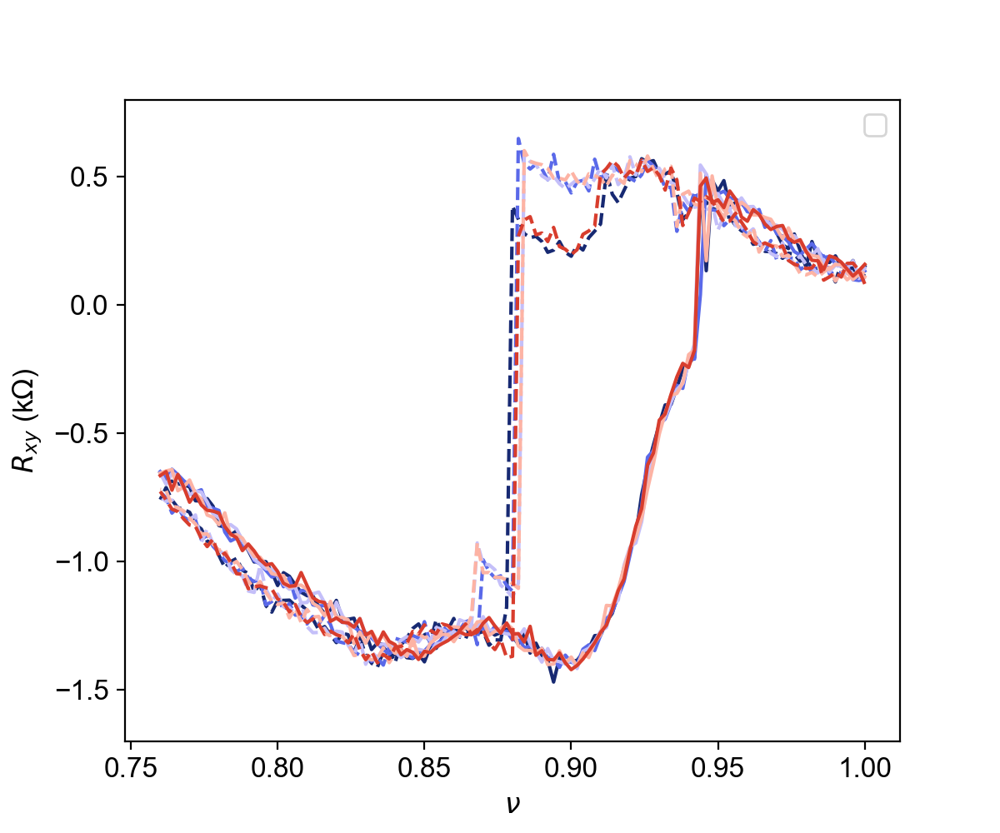

No handles with labels found to put in legend.


In [659]:
N = 6
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

plt.figure(figsize=(6,5))
plt.plot((dswitch1_forward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch1_forward.lockin830_X[:]/1e-9/1000, color = cs[0])
plt.plot((dswitch1_backward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch1_backward.lockin830_X[:]/1e-9/1000, '--', color = cs[0])
plt.plot((dswitch2_forward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch2_forward.lockin830_X[:]/1e-9/1000, color = cs[1])
plt.plot((dswitch2_backward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch2_backward.lockin830_X[:]/1e-9/1000, '--', color = cs[1])
plt.plot((dswitch3_forward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch3_forward.lockin830_X[:]/1e-9/1000, color = cs[2])
plt.plot((dswitch3_backward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch3_backward.lockin830_X[:]/1e-9/1000, '--', color = cs[2])
plt.plot((dswitch4_forward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch4_forward.lockin830_X[:]/1e-9/1000, color = cs[3])
plt.plot((dswitch4_backward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch4_backward.lockin830_X[:]/1e-9/1000, '--', color = cs[3])
plt.plot((dswitch5_forward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch5_forward.lockin830_X[:]/1e-9/1000, color = cs[4])
plt.plot((dswitch5_backward.srframe_volt_p1_set[:] - V0)/Vfull*4, dswitch5_backward.lockin830_X[:]/1e-9/1000, '--', color = cs[4])


plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xy}$ (k$\Omega$)')
#plt.xlim(-0.2,0.2)
plt.ylim(-1.7,0.8)
plt.legend()

## bit switching with gate and field

In [849]:
dswitch_gateB = qc.load_data('data/2021-01-15/#017_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_magnetic_bit_1nA_4K_13-36-08')

<IPython.core.display.Javascript object>


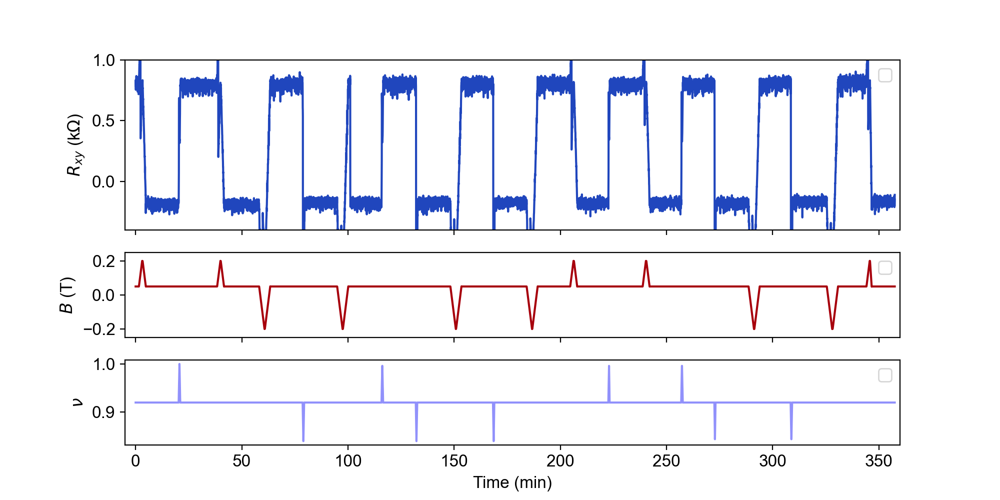

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [850]:
N = 11 # some plots showing sign change
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, axs = plt.subplots(3, 1, figsize=(10, 5), gridspec_kw={'height_ratios': [2,1,1]}, sharex=True)


axs[0].plot(dswitch_gateB.time0[:]/60, dswitch_gateB.lockin830_X[:]/1e-9/1000, color = cs[1])

axs[0].set_ylim(-0.4, 1)
axs[0].set_xlim(-5, 360)
axs[0].set_yticks([0,0.5,1])
axs[0].set_xticks([0,50,100,150,200,250,300,350])
axs[0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[0].legend()


axs[1].plot(dswitch_gateB.time0[:]/60, dswitch_gateB.triton_field, color = cs[9])
axs[1].set_ylim(-0.25, 0.25)
axs[1].set_xlim(-5, 360)
axs[1].set_yticks([-0.2,0,0.2])
axs[1].set_ylabel('$B$ (T)')
axs[1].legend()

axs[2].plot(dswitch_gateB.time0[:]/60, (dswitch_gateB.srframe_volt_p1[:]-0.5)/10*4, color = cs[3])
#axs[2].set_ylim(2.5, 3.1)
axs[2].set_xlim(-5, 360)
axs[2].set_xlabel('Time (min)')
#axs[2].set_yticks([-0.,0.2])
axs[2].set_ylabel(r'$\nu$')
axs[2].legend()

In [ ]:
N = 11 # some plots showing sign change
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))


fig, axs = plt.subplots(3, 1, figsize=(10, 5), gridspec_kw={'height_ratios': [2,1,1]}, sharex=True)


axs[0].plot(dswitch_gateB.time0[:]/60, dswitch_gateB.lockin830_X[:]/1e-9/1000, color = cs[1])

axs[0].set_ylim(-0.4, 1)
axs[0].set_xlim(-5, 360)
axs[0].set_yticks([0,0.5,1])
axs[0].set_xticks([0,50,100,150,200,250,300,350])
axs[0].set_ylabel('$R_{xy}$ (k$\Omega$)')
axs[0].legend()


axs[1].plot(dswitch_gateB.time0[:]/60, dswitch_gateB.triton_field, color = cs[9])
axs[1].set_ylim(-0.25, 0.25)
axs[1].set_xlim(-5, 360)
axs[1].set_yticks([-0.2,0,0.2])
axs[1].set_ylabel('$B$ (T)')
axs[1].legend()

axs[2].plot(dswitch_gateB.time0[:]/60, (dswitch_gateB.srframe_volt_p1[:]-0.5)/10*4, color = cs[3])
#axs[2].set_ylim(2.5, 3.1)
axs[2].set_xlim(-5, 360)
axs[2].set_xlabel('Time (min)')
#axs[2].set_yticks([-0.,0.2])
axs[2].set_ylabel(r'$\nu$')
axs[2].legend()

# device S13, 1.09$^\circ$ Rxx T dependence

## full range

In [375]:
dtempbase = qc.load_data('data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59')
dtemp_1 = qc.load_data('data/2020-12-03/#005_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K_11-50-09')
dtemp_2 = qc.load_data('data/2020-12-03/#006_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K_17-12-31')
dtemp_3 = qc.load_data('data/2020-12-03/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K_19-21-48')
dtemp_4 = qc.load_data('data/2020-12-03/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K_22-51-46')
dtemp_5 = qc.load_data('data/2020-12-04/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K_20-18-38')
dtemp_6 = qc.load_data('data/2020-12-05/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K_07-42-45')

In [376]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx0225 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin830')))

In [377]:
Vgatefull0225 = 10
V00225 = 0.5

In [378]:
nugate0225 = np.interp(gate, [V00225 - Vgatefull0225*5/4, V00225 + Vgatefull0225*5/4], [-5, 5])

In [379]:
Rxx0225Tfunc = RectBivariateSpline(nugate0225, temps, Rxx0225.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


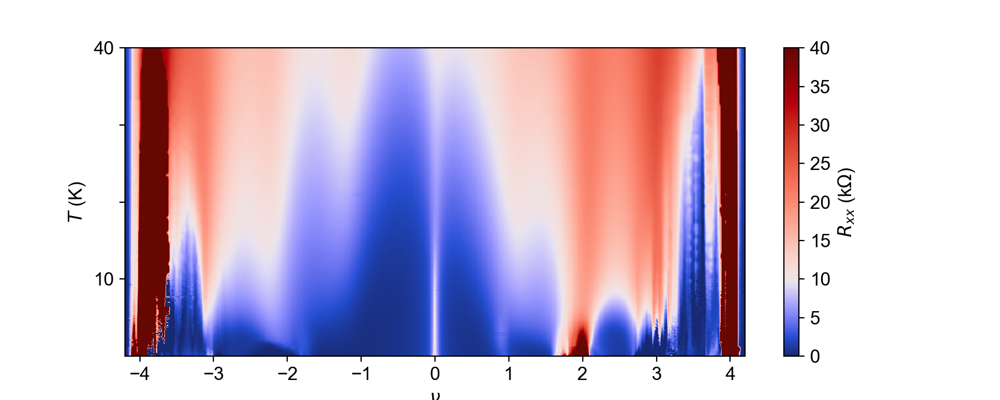

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fb05a4082e8>,
 [Text(0, 10, '10'), Text(0, 20, ''), Text(0, 30, ''), Text(0, 40, '40')])

In [374]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx0225Tint = Rxx0225Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=10, vmin=0, vmax=40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

## SC plot

<IPython.core.display.Javascript object>


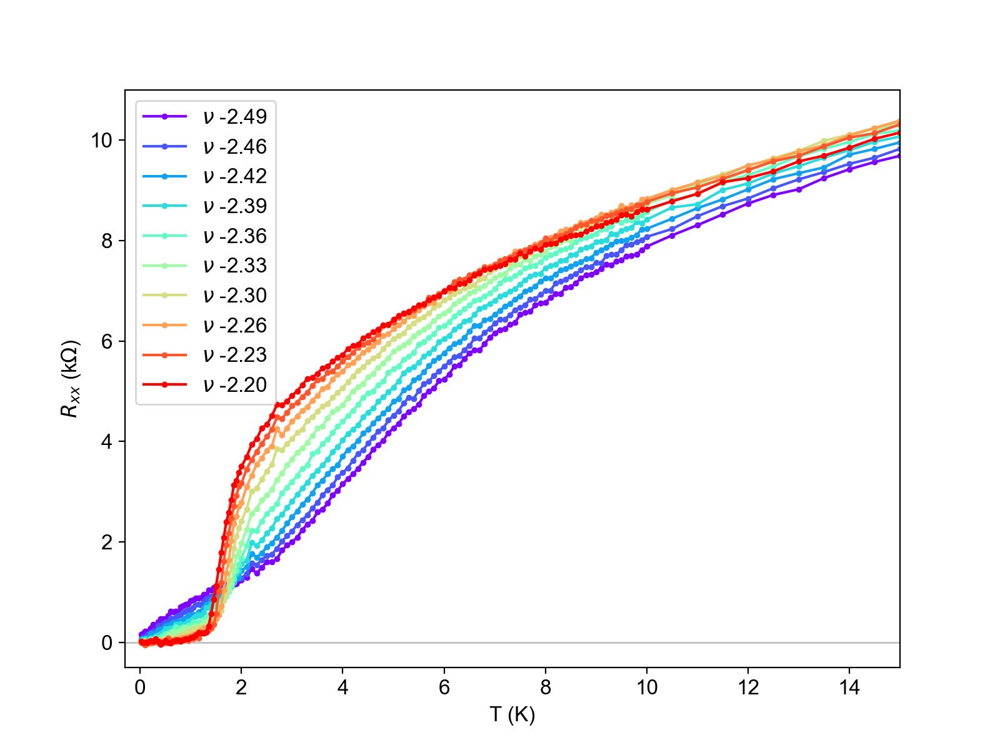

In [423]:
N = 10
cs = plt.get_cmap('rainbow')(np.linspace(0,1,N))


plt.figure(figsize=(8, 6))
for i in range(10):
    indx=2*(66+i) 
    plt.plot(temps, gaussian_filter(Rxx0225[:, indx],0)/1000, '.-',markersize=5, color = cs[i], label=r'$\nu$ {:.2f}'.format((gate[indx]-0.5)/10*4))

plt.hlines(0, -1,15, color='gray', lw=1, alpha=0.5)

plt.xlim(-0.3,15)
plt.ylim(-0.5,11)
plt.xlabel('T (K)')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.legend()

## zoom in  one quarter

<IPython.core.display.Javascript object>


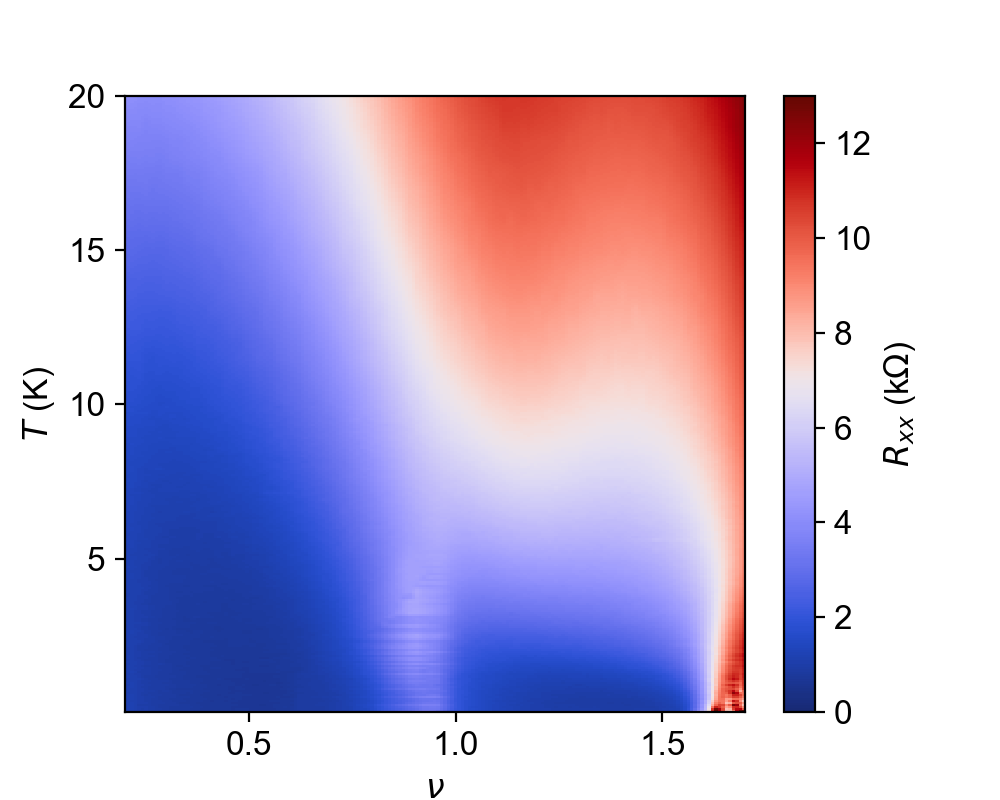

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(0.025, 20.0)

In [515]:
plt.figure(figsize=(5, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0225Tint, (0, 0))/1000, norm=TwoSlopeNorm(vcenter=7, vmin=0, vmax=13), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')
plt.xticks([0.5, 1, 1.5])
plt.yticks([5, 10, 15, 20])
plt.xlim(0.2,1.7)
plt.ylim(0.025,20)


<IPython.core.display.Javascript object>


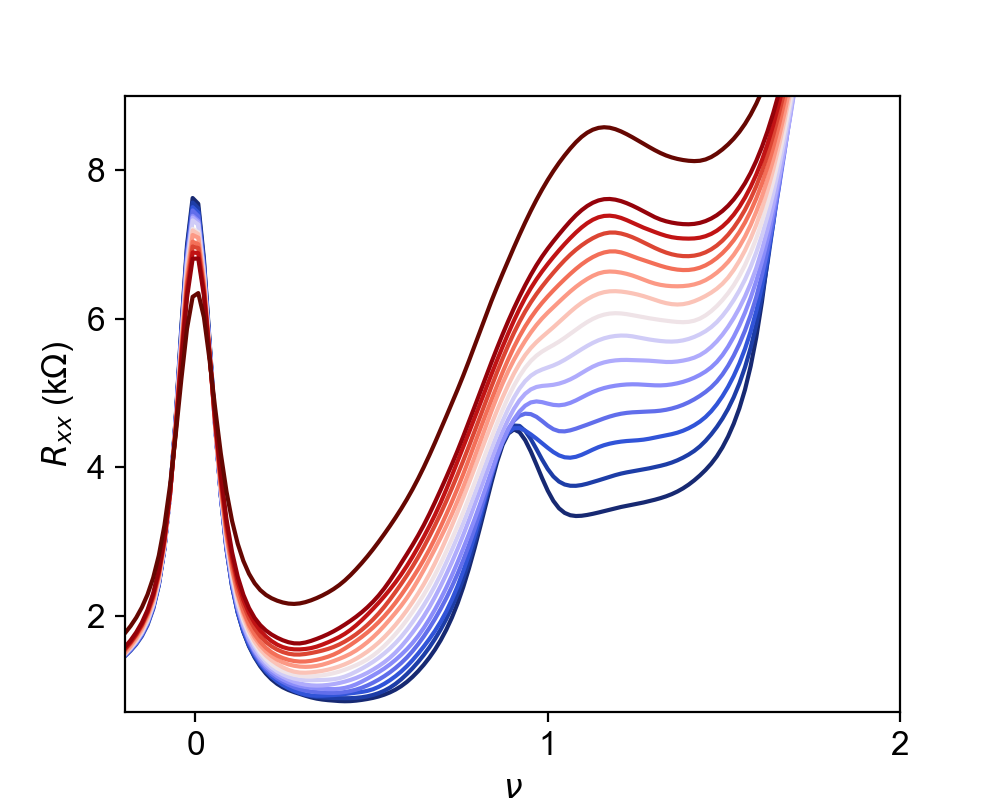

(0.7, 9.0)

In [536]:
plt.figure(figsize=(5, 4))

N = 15
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(11,26):
    indx =  i*5
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, gaussian_filter(Rxx0225[indx,:],2)/1000,  color = cs[i-11], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-0.2,2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.yticks([2, 4, 6, 8])
plt.xticks([0, 1, 2])
plt.ylim(0.7,9)
#plt.legend()

# device S13, 1.09$^\circ$ Rxy T dependence

In [540]:
data_n_T_base = qc.load_data('data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23')
data_n_T_1 = qc.load_data('data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21')
data_n_T_2 = qc.load_data('data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27')
data_n_T_3 = qc.load_data('data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41')
data_n_T_4 = qc.load_data('data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17')
data_n_T_5 = qc.load_data('data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy2528_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin865')))

In [541]:
data_n_T_base = qc.load_data('data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12')
data_n_T_1 = qc.load_data('data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16')
data_n_T_2 = qc.load_data('data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14')
data_n_T_3 = qc.load_data('data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25')
data_n_T_4 = qc.load_data('data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35')
data_n_T_5 = qc.load_data('data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy2528_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin865')))

error reading file /Users/yiranzhang/Desktop/Triton data/data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35/triton_pid_setpoint_set_srframe_volt_p1_set 2.dat
Traceback (most recent call last):
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/format.py", line 112, in read
    self.read_one_file(data_set, f, ids_read)
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/gnuplot_format.py", line 167, in read_one_file
    raise ValueError('duplicate data id found: ' + array_id)
ValueError: duplicate data id found: lockin830_2_X

error reading file /Users/yiranzhang/Desktop/Triton data/data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16/triton_pid_setpoint_set_srframe_volt_p1_set 2.dat
Traceback (most recent call last):
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/format.py", line 112, in read
    self.read_one_file(data_set, f, ids_rea

<IPython.core.display.Javascript object>


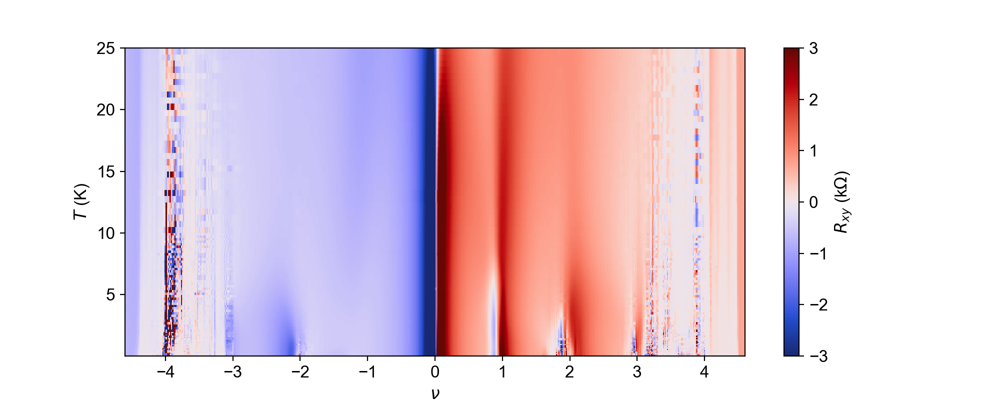

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


(0.025, 25.0)

In [542]:
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter((Rxy2528_0p5T-Rxy2528_m0p5T)/2,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-3, vmax=3))


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,25)

<IPython.core.display.Javascript object>


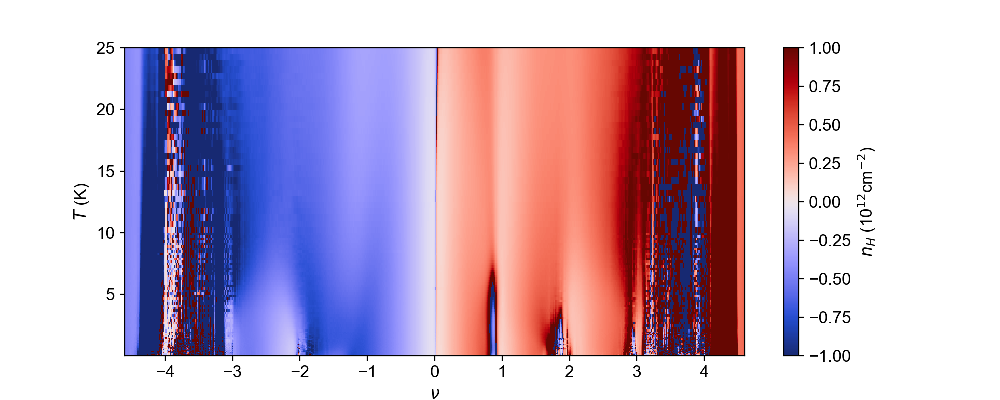

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  This is separate from the ipykernel package so we can avoid doing imports until


(0.025, 25.0)

In [543]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, 0.5/((Rxy2528_0p5T-Rxy2528_m0p5T)/2)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-1, vmax=1))


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

<IPython.core.display.Javascript object>


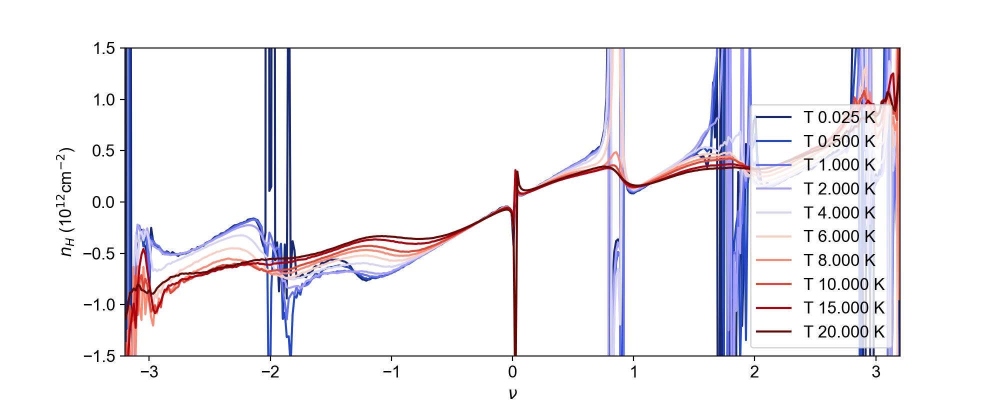

In [544]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*10
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, 0.5/((Rxy2528_0p5T[indx,:]-Rxy2528_m0p5T[indx,:])/2)/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-3.2,3.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-1.5,1.5)
plt.legend()

## one quarter 0.5T Rxx Rxy $\sigma_{xy}$ T dependence

In [998]:
data_n_T_base = qc.load_data('data/2021-01-10/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p5T_13-13-45')
data_n_T_1 = qc.load_data('data/2021-01-10/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p5T_13-26-42')
data_n_T_2 = qc.load_data('data/2021-01-10/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_16-37-53')
data_n_T_3 = qc.load_data('data/2021-01-10/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_17-16-42')
data_n_T_4 = qc.load_data('data/2021-01-10/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_20-25-47')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:]))
Rxx0225_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865')))
Rxy2528_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830')))

error reading file /Users/yiranzhang/Desktop/Triton data/data/2021-01-10/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_20-25-47/triton_pid_setpoint_set_srframe_volt_p1_set 2.dat
Traceback (most recent call last):
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/format.py", line 112, in read
    self.read_one_file(data_set, f, ids_read)
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/gnuplot_format.py", line 167, in read_one_file
    raise ValueError('duplicate data id found: ' + array_id)
ValueError: duplicate data id found: lockin830_2_X



In [999]:
data_n_T_base = qc.load_data('data/2021-01-11/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p5T_11-02-13')
data_n_T_1 = qc.load_data('data/2021-01-11/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p5T_11-38-18')
data_n_T_2 = qc.load_data('data/2021-01-11/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_14-49-29')
data_n_T_3 = qc.load_data('data/2021-01-11/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_15-28-17')
data_n_T_4 = qc.load_data('data/2021-01-11/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_16-47-39')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:]))
Rxx0225_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865')))
Rxy2528_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830')))

<IPython.core.display.Javascript object>


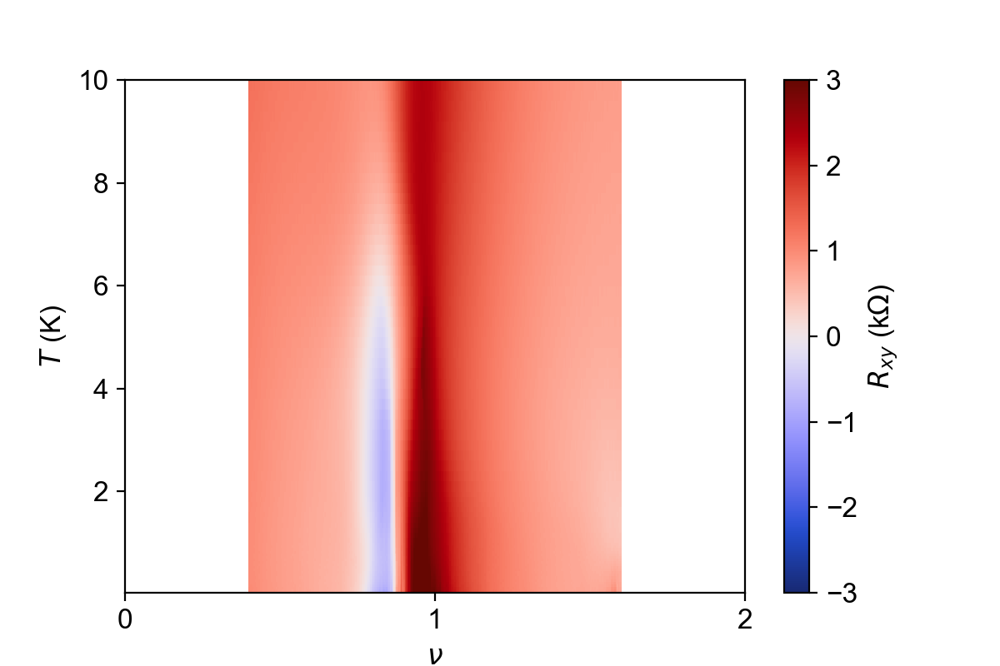

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [1000]:
Rxy_sym = (Rxy2528_0p5T-Rxy2528_m0p5T)/2

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter(Rxy_sym,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-3, vmax=3))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


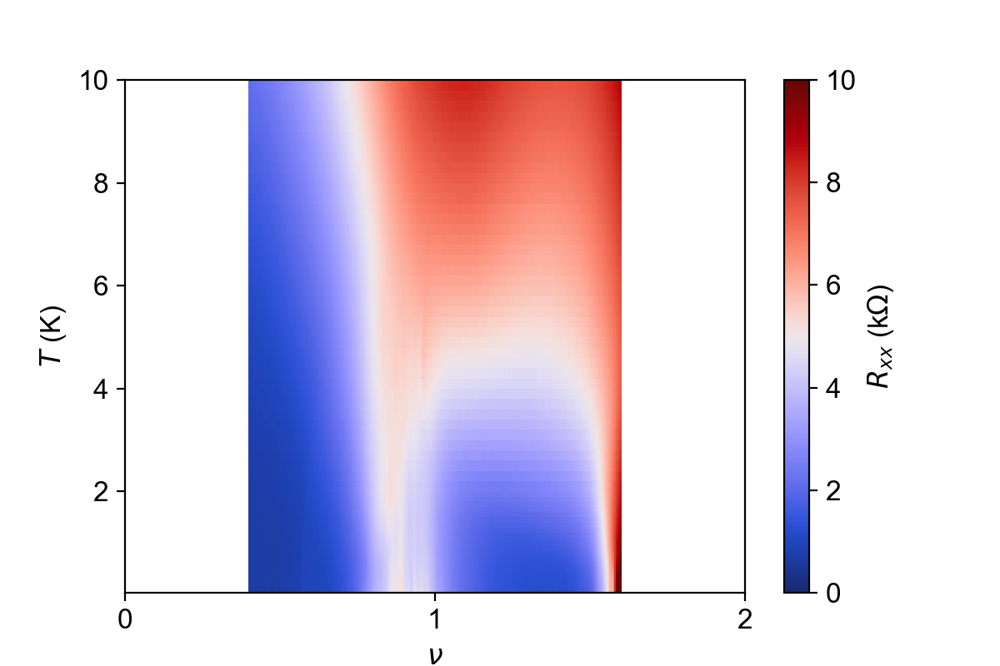

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [1001]:
Rxx_sym = (Rxx0225_0p5T+Rxx0225_m0p5T)/2

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter(Rxx_sym,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=5, vmin=0, vmax=10))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


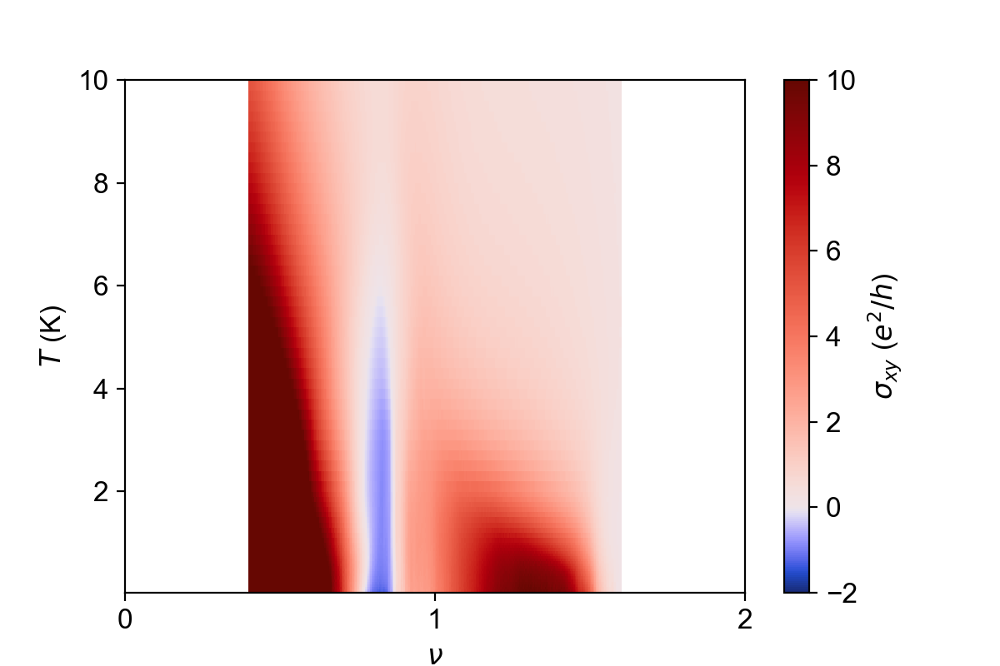

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [1002]:
sigma_xy = Rxy_sym/((Rxx_sym)**2+Rxy_sym**2)

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, sigma_xy/(3.874e-5), cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2, vmax=10))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$\sigma_{xy}$ ($e^2/h$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


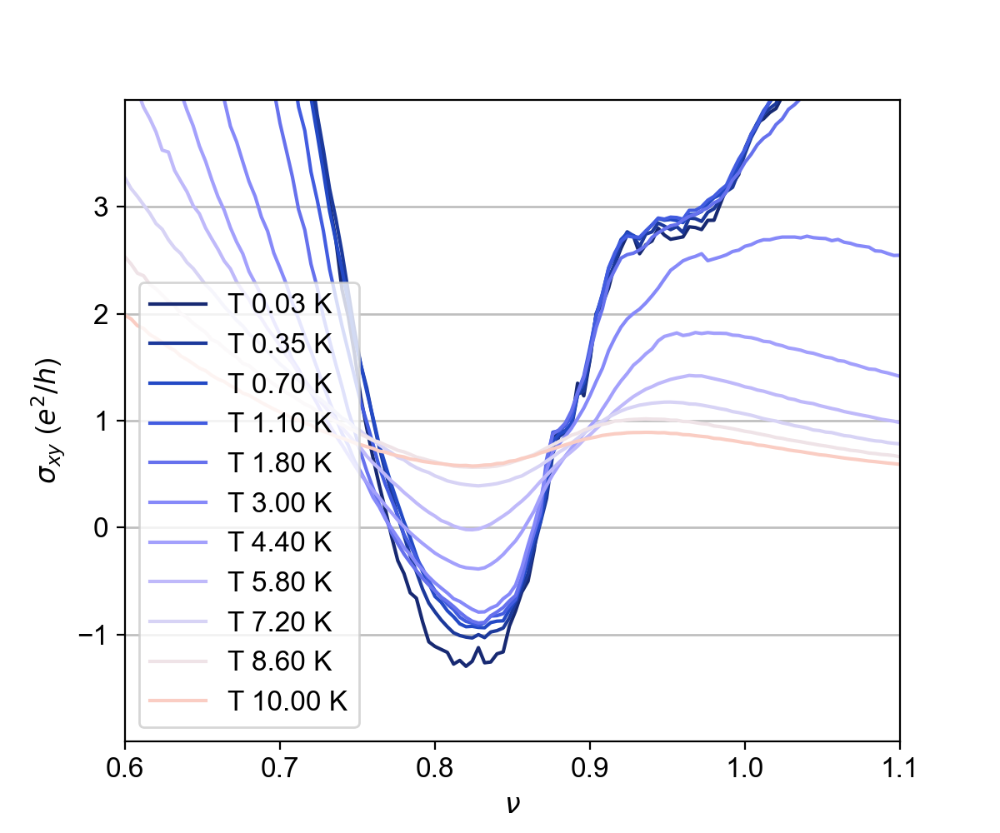

In [1003]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(11):
    indx =  i*7
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i], label='T {:.2f} K'.format(temps[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-2,4)
plt.xlim(0.6,1.1)
plt.yticks([-1,0,1,2,3])
plt.legend()

<IPython.core.display.Javascript object>


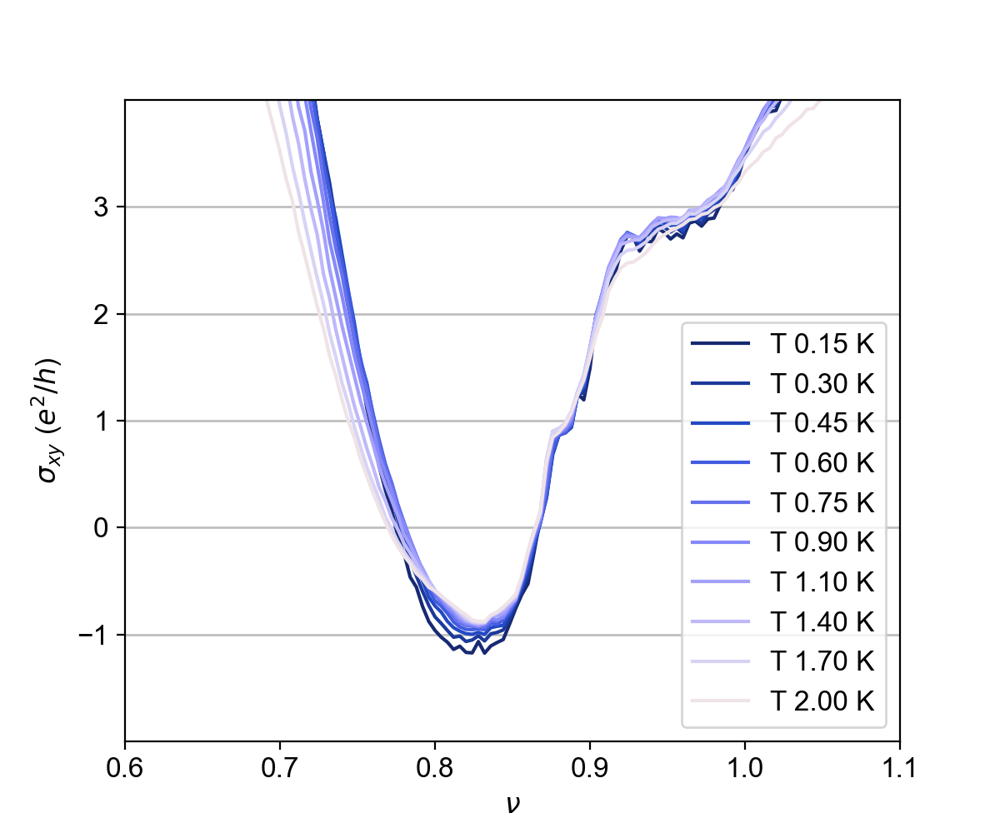

In [908]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(1,11):
    indx =  i*3
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i-1], label='T {:.2f} K'.format(temps[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-2,4)
plt.xlim(0.6,1.1)
plt.yticks([-1,0,1,2,3])
plt.legend()

## one quarter 0.25T Rxx Rxy $\sigma_{xy}$ T dependence

In [992]:
data_n_T_base = qc.load_data('data/2021-01-16/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_0p25T_11-16-19')
data_n_T_1 = qc.load_data('data/2021-01-16/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy0p25T_11-27-26')
data_n_T_2 = qc.load_data('data/2021-01-16/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy0p25T_14-38-39')
data_n_T_3 = qc.load_data('data/2021-01-16/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy0p25T_15-17-29')
data_n_T_4 = qc.load_data('data/2021-01-16/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy0p25T_16-44-18')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:]))
Rxx0225_0p25T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865')))
Rxy2528_0p25T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830')))

In [993]:
data_n_T_base = qc.load_data('data/2021-01-17/#001_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_base_3nA_gatesweep_-0p25T_13-35-47')
data_n_T_1 = qc.load_data('data/2021-01-17/#002_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweepto1K_Rxy-0p25T_13-45-37')
data_n_T_2 = qc.load_data('data/2021-01-17/#003_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p25T_16-56-50')
data_n_T_3 = qc.load_data('data/2021-01-17/#004_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep1p5to2K_Rxy-0p25T_17-35-39')
data_n_T_4 = qc.load_data('data/2021-01-17/#005_S13_865_2-25_830_25-28_8302_2-29_8303_29-28_3nA_sweepgateTsweep2p2to10K_Rxy-0p25T_19-50-36')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:]))
Rxx0225_m0p25T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin865')))
Rxy2528_m0p25T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830')))

<IPython.core.display.Javascript object>


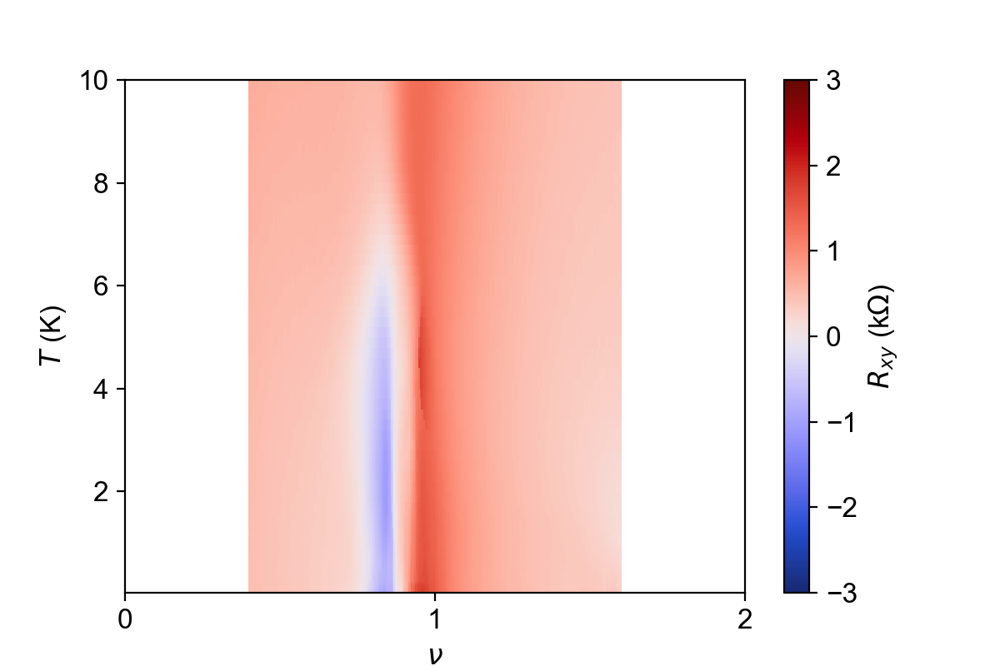

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [994]:
Rxy_sym = (Rxy2528_0p25T-Rxy2528_m0p25T)/2

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter(Rxy_sym,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-3, vmax=3))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xy}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


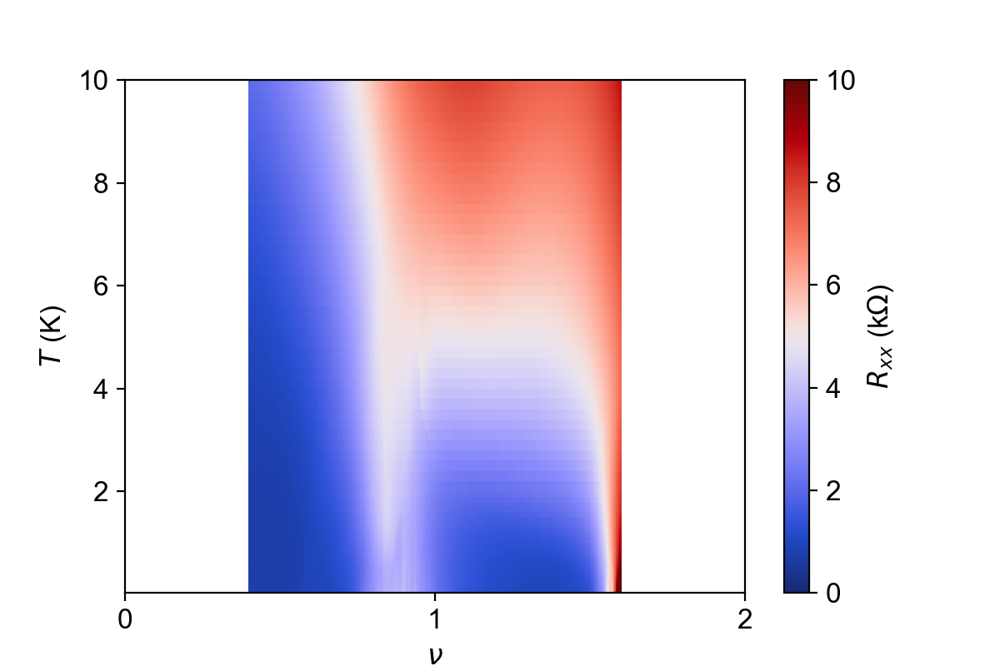

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [995]:
Rxx_sym = (Rxx0225_0p25T+Rxx0225_m0p25T)/2

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, gaussian_filter(Rxx_sym,0)/1000, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=5, vmin=0, vmax=10))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


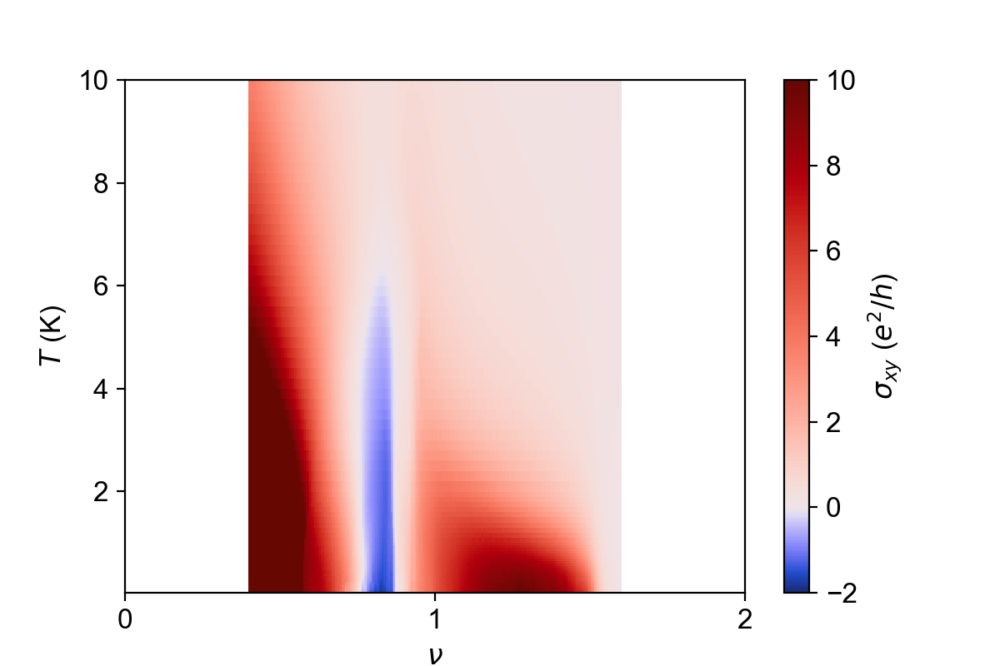

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  after removing the cwd from sys.path.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  after removing the cwd from sys.path.


(0.025, 10.0)

In [996]:
sigma_xy = Rxy_sym/((Rxx_sym)**2+Rxy_sym**2)

plt.figure(figsize=(6, 4))
plt.pcolormesh((gate-V00225)/Vgatefull0225*4, temps, sigma_xy/(3.874e-5), cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2, vmax=10))


plt.xlabel(r'$\nu$')
plt.xticks([0, 1, 2])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$\sigma_{xy}$ ($e^2/h$)')
plt.axis()
plt.ylim(0.025,10)

<IPython.core.display.Javascript object>


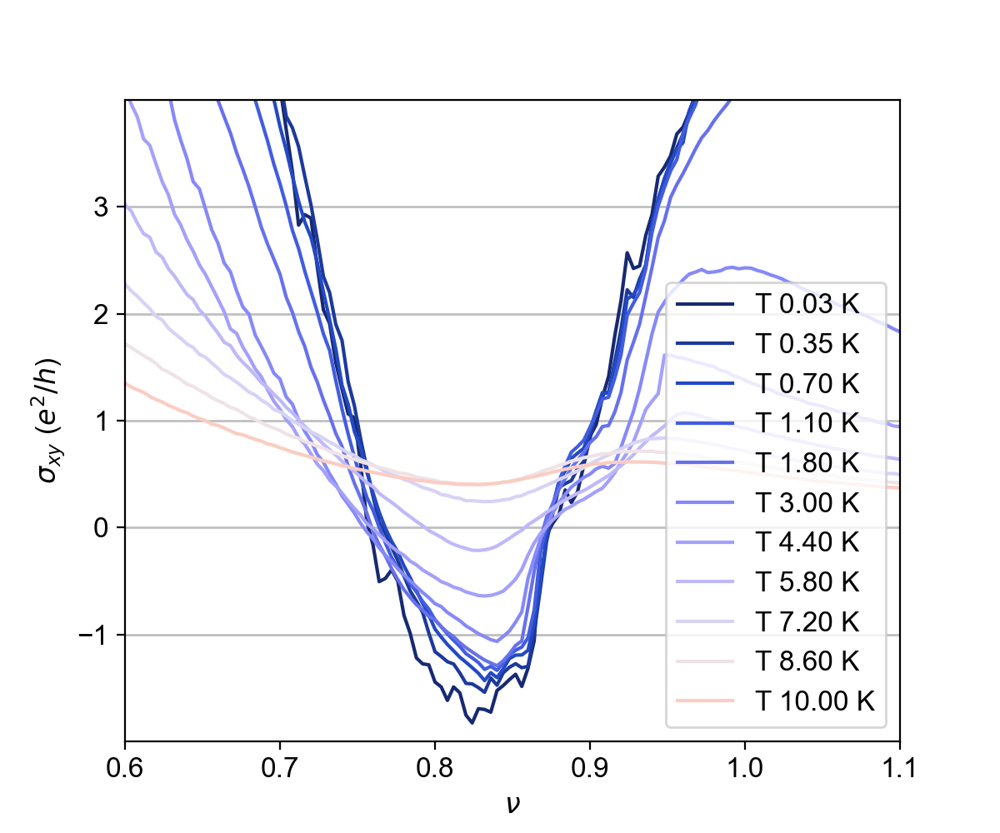

In [997]:
plt.figure(figsize=(6, 5))

N = 19
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(11):
    indx =  i*7
    plt.plot((gate[:]-V00225)/Vgatefull0225*4, sigma_xy[indx,:]/(3.874e-5),  color = cs[i], label='T {:.2f} K'.format(temps[indx]))

plt.hlines(-1, 0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(0,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(1,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(2,  0,2, color='gray', lw=1, alpha=0.5)
plt.hlines(3,  0,2, color='gray', lw=1, alpha=0.5)
plt.xlabel(r'$\nu$')
plt.ylabel('$\sigma_{xy}$ ($e^2/h$)')
plt.ylim(-2,4)
plt.xlim(0.6,1.1)
plt.yticks([-1,0,1,2,3])
plt.legend()

# device S13, 1.09$^\circ$ SC Fraunhofer pattern nu = -2.32

In [179]:
d_S13_holeSC_Fpattern = qc.load_data('data/2020-12-08/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_vg_-5p3_field_Ic_baseT_23-14-16')
Bfield = d_S13_holeSC_Fpattern.triton_field_set_stable_set[:]
I_DC = d_S13_holeSC_Fpattern.srframe_volt_p5_set[0, :]*100
Rxx0225 = npd.Rxxfromdata(d_S13_holeSC_Fpattern, 1e-9, 'lockin830')

In [180]:
# filling
Vfull = 10
V0 = 0.5
nu = (-5.3-V0)/Vfull*4
nu

-2.32

<IPython.core.display.Javascript object>


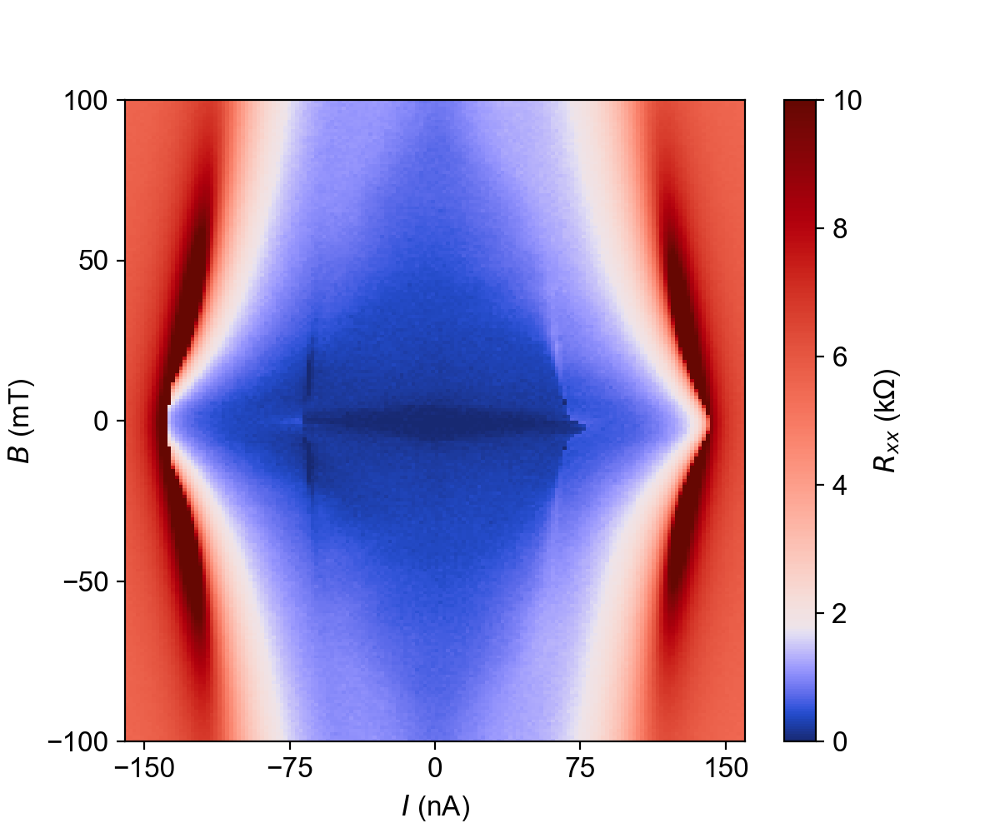

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


Text(0, 0.5, '$B$ (mT)')

In [181]:
plt.figure(figsize=(6, 5))
plt.pcolormesh(I_DC, Bfield*1000, gaussian_filter(Rxx0225[:,:], (0, 0))/1000, norm=TwoSlopeNorm(1.8, vmin=0, vmax=10), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlim(-160,160)
plt.xticks([-150 ,-75, 0, 75, 150])
plt.yticks([-100 ,-50, 0, 50, 100])
plt.xlabel(r'$I$ (nA)')
plt.ylabel(r'$B$ (mT)')